#Librerias

Installing Libraries

In [ ]:
!pip install numpy matplotlib pymc arviz pandas xarray openseespy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 MB 9.8 MB/s eta 0:00:00


Importing Libraries

In [ ]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
from matplotlib.ticker import MultipleLocator

from pymc import HalfCauchy, Model, Normal, sample

print(f"Running on PyMC v{pm.__version__}")

Running on PyMC v5.10.4


Plotting Configuration

In [ ]:
plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams['figure.dpi'] = 300
plt.rcParams.update({"axes.grid" : True, "grid.color": "0.8","lines.color": "k", "grid.linewidth": 0.5, "axes.edgecolor": "0.8", 'font.size': 20,
                    'xtick.minor.bottom': True, 'ytick.minor.left': True, 'xtick.bottom': True, 'ytick.left': True,
                     "font.family": "STIXGeneral", "mathtext.fontset": "stix"})

# Configurar rcParams para tick marks
# plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'out'
# plt.rcParams['xtick.major.size'] = 4
# plt.rcParams['xtick.major.width'] = 1
plt.rcParams['ytick.major.size'] = 4
plt.rcParams['ytick.major.width'] = 1
# plt.rcParams['xtick.minor.size'] = 2
# plt.rcParams['xtick.minor.width'] = 0.5
# plt.rcParams['ytick.minor.size'] = 4
# plt.rcParams['ytick.minor.width'] = 1

## Directorio

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Directorio Felipe

In [ ]:
# DirName ='/content/drive/MyDrive/02-PhD/PaperManual'

Directorio Oscar

In [ ]:
DirName ='/content/drive/MyDrive/PaperManual'

# Log-like OP

In [ ]:
# define a pytensor Op for our likelihood function
class LogLike(pt.Op):

    itypes = [pt.dvector,pt.dscalar]   # expects a vector of parameter values when called
    otypes = [pt.dscalar]  # outputs a single scalar value (the log likelihood)

    def __init__(self, loglike, data, x):
      #, sigma):
        """
        Initialise the Op with various things that our log-likelihood function
        requires. Below are the things that are needed in this particular
        example.

        Parameters
        ----------
        loglike:
            The log-likelihood (or whatever) function we've defined
        data:
            The "observed" data that our log-likelihood function takes in
        x:
            The dependent variable (aka 'x') that our model requires
        sigma:
            The noise standard deviation that our function requires.
        """
        # add inputs as class attributes
        self.likelihood = loglike
        self.data = data
        self.x = x
        self.sigma = 1#sigma

    def perform(self, node, inputs, outputs):
        # the method that is used when calling the Op
        theta,sigma = inputs  # this will contain my variables

        # call the log-likelihood function
        logl = self.likelihood(theta, sigma, self.x, self.data)#, sigma)

        outputs[0][0] = np.array(logl)  # output the log-likelihood

# Prueba de escritorio #1

In [ ]:
size = 2000
true_quad_coeff = 5
true_slope = 3
true_intercept = 2

x = np.linspace(0, 10, size)

# y = a + b*x
true_regression_line = true_intercept + true_slope * x + true_quad_coeff * x**2

sigma = 20
noise = np.random.randn(size)*sigma

# add noise
y = true_regression_line + noise

data = pd.DataFrame(dict(x=x, y=y))

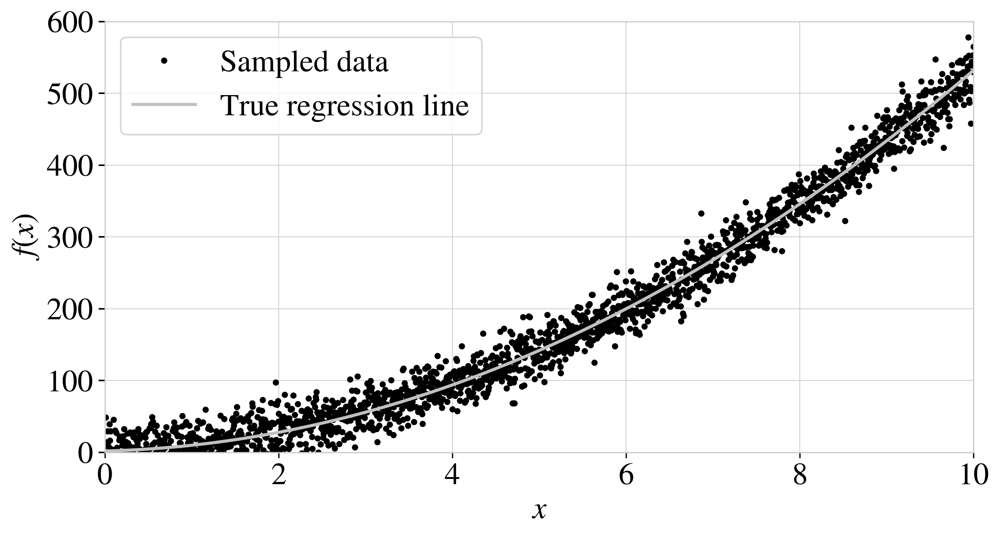

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111, xlabel="$x$", ylabel="$f(x)$")
ax.plot(x, y, ".", label="Sampled data", color='k')
ax.plot(x, true_regression_line, color='silver', label="True regression line", lw=2.0)
plt.xlim([0, 10])
plt.ylim([0, 600])
plt.legend(loc=0);
plt.show()

In [ ]:
# Analyzing the model

# Define linear model
with pm.Model() as linear_model:
    # Priors
    intercept = pm.Normal('intercept', mu=0, sigma=10)
    slope = pm.Normal('slope', mu=0, sigma=10)
    noise = pm.HalfNormal('noise', sigma=1)

    # Model
    y_estimated_linear = intercept + slope * x

    # Likelihood
    likelihood_linear = pm.Normal('y_linear', mu=y_estimated_linear, sigma=noise, observed=y)

    # obtain starting values via MAP
    start = pm.find_MAP()

    # Sample
    linear_trace = pm.sample(2000, start=start)

# Define quadratic model
with pm.Model() as quad_model:
    # Priors
    intercept = pm.Normal('intercept', mu=0, sigma=10)
    slope = pm.Normal('slope', mu=0, sigma=10)
    quad_coeff = pm.Normal('quad_coeff', mu=0, sigma=10)
    noise = pm.HalfNormal('noise', sigma=1)

    # Model
    y_estimated_quad = intercept + slope * x + quad_coeff * x**2

    # Likelihood
    likelihood_quad = pm.Normal('y_quad', mu=y_estimated_quad, sigma=noise, observed=y)

    # obtain starting values via MAP
    start = pm.find_MAP()

    # Sample
    quad_trace = pm.sample(2000, start=start)

<ipython-input-9-abc4fba0bdc9>:20: FutureWarning: The `start` kwarg was renamed to `initvals` and can now do more. Please check the docstring.
  linear_trace = pm.sample(2000, start=start)


<ipython-input-9-abc4fba0bdc9>:40: FutureWarning: The `start` kwarg was renamed to `initvals` and can now do more. Please check the docstring.
  quad_trace = pm.sample(2000, start=start)


In [ ]:
plt.rcParams.update(plt.rcParamsDefault)

plt.rcParams['figure.dpi'] = 300
plt.rcParams.update({"axes.grid" : True, "grid.color": "0.8","lines.color": "k", "grid.linewidth": 0.5, "axes.edgecolor": "0.8", 'font.size': 20,
                    'xtick.minor.bottom': True, 'ytick.minor.left': True, 'xtick.bottom': True, 'ytick.left': True,
                     "font.family": "STIXGeneral", "mathtext.fontset": "stix"})

# Configurar rcParams para tick marks
# plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'out'
# plt.rcParams['xtick.major.size'] = 4
# plt.rcParams['xtick.major.width'] = 1
plt.rcParams['ytick.major.size'] = 4
plt.rcParams['ytick.major.width'] = 1
# plt.rcParams['xtick.minor.size'] = 2
# plt.rcParams['xtick.minor.width'] = 0.5
# plt.rcParams['ytick.minor.size'] = 4
# plt.rcParams['ytick.minor.width'] = 1

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


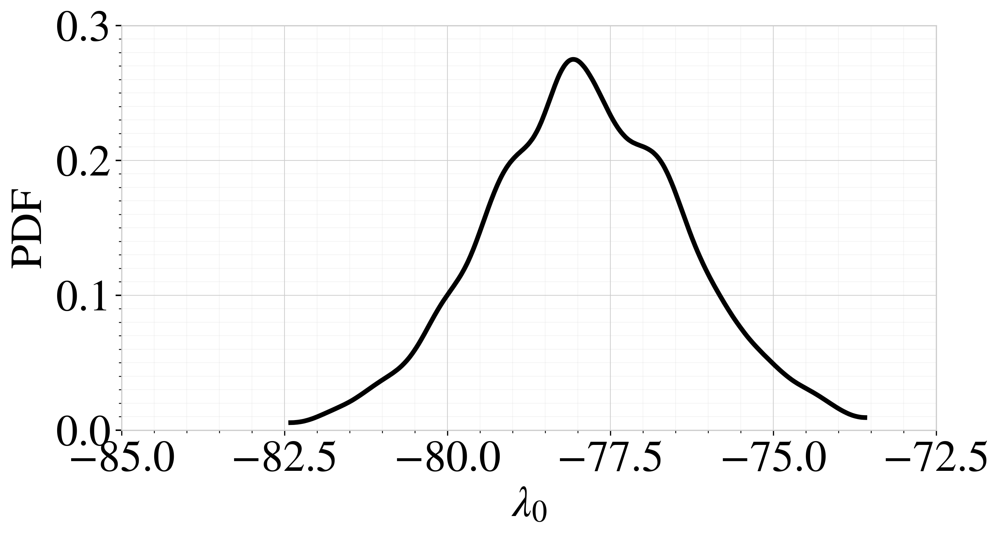

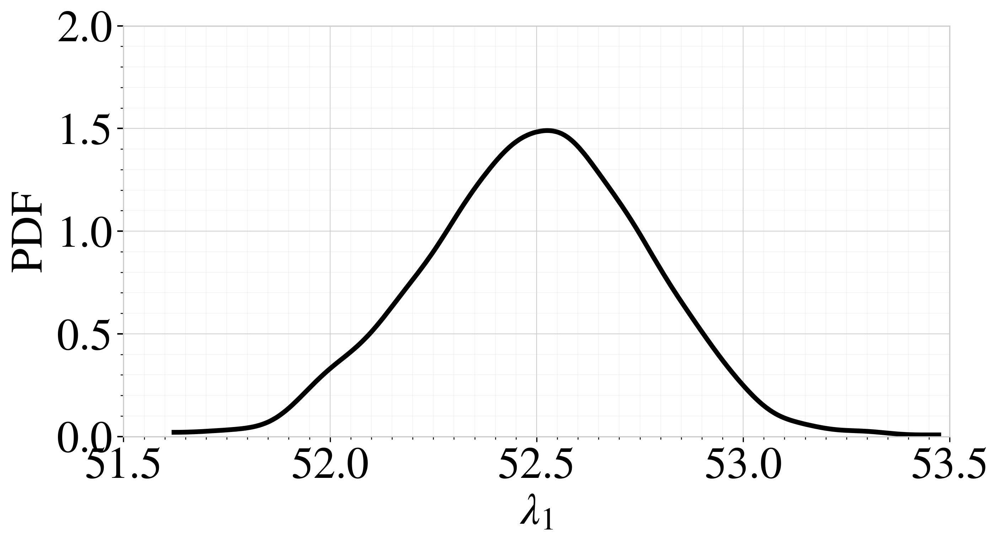

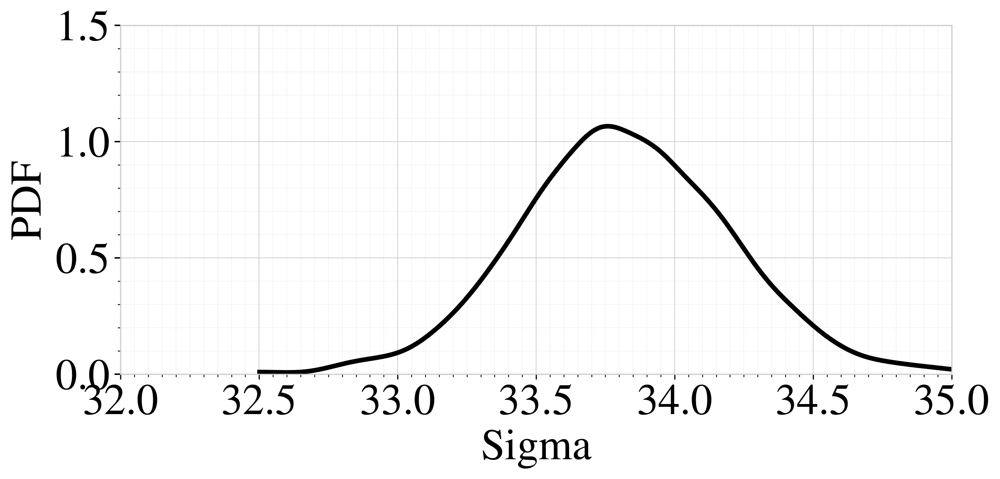

In [ ]:
fig = plt.figure(figsize=(10,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(linear_trace.posterior.intercept[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$\lambda_0$', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([-85, -72.5])
plt.ylim([0, 0.3])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.5))
ax1.yaxis.set_minor_locator(MultipleLocator(0.01))

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

fig = plt.figure(figsize=(10,5))

ax2 = az.plot_dist(linear_trace.posterior.slope[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$\lambda_1$', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([51.5, 53.5])
plt.ylim([0, 2])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.05))
ax2.yaxis.set_minor_locator(MultipleLocator(0.1))

plt.show()

# # Tercer  subgráfico
# plt.subplot(1, 3, 3)

fig = plt.figure(figsize=(10,5))

ax3 = az.plot_dist(linear_trace.posterior.noise[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('Sigma', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([32, 35])
plt.ylim([0, 1.5])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.05))
ax3.yaxis.set_minor_locator(MultipleLocator(0.1))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

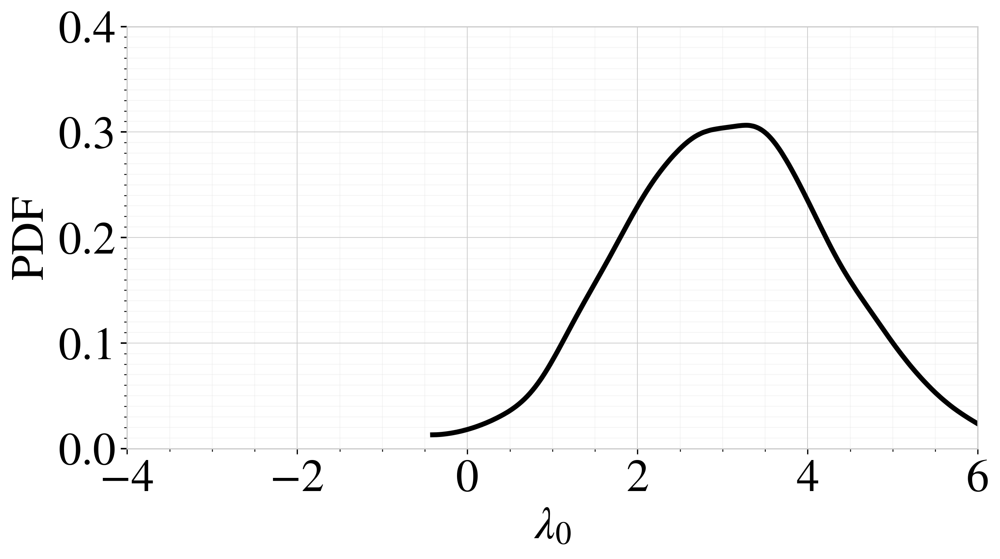

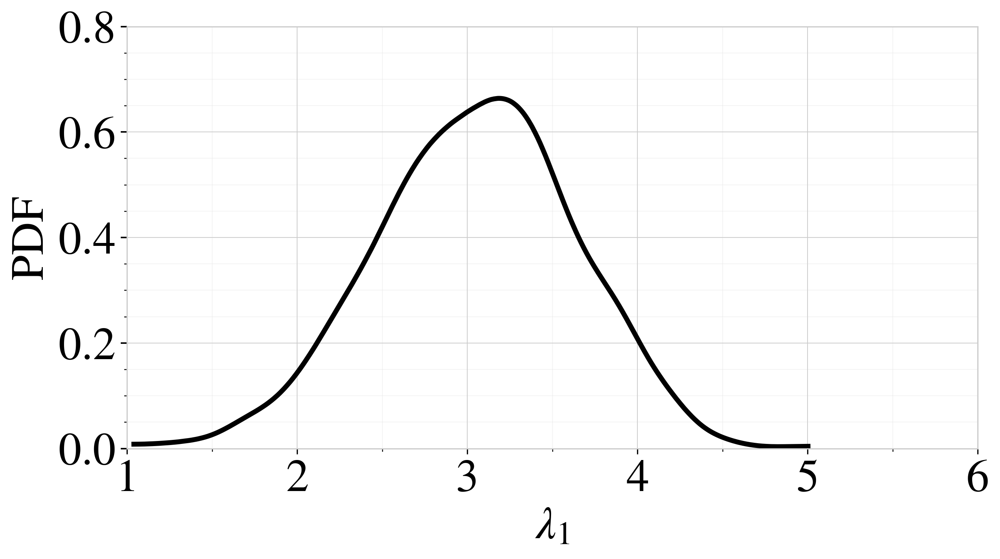

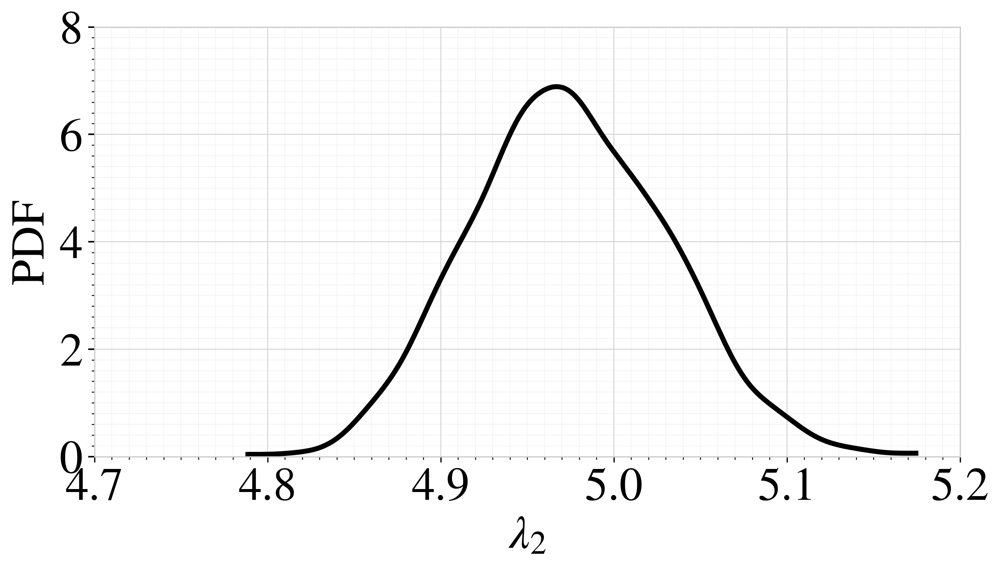

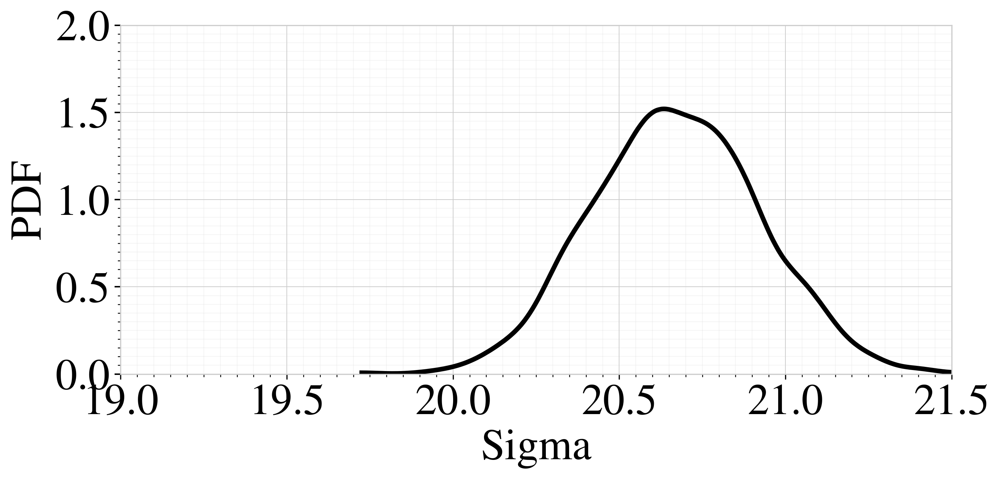

In [ ]:
fig = plt.figure(figsize=(10,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(quad_trace.posterior.intercept[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$\lambda_0$', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([-4, 6])
plt.ylim([0, 0.4])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.5))
ax1.yaxis.set_minor_locator(MultipleLocator(0.01))

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

fig = plt.figure(figsize=(10,5))

ax2 = az.plot_dist(quad_trace.posterior.slope[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$\lambda_1$', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([1, 6])
plt.ylim([0, 0.8])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.5))
ax2.yaxis.set_minor_locator(MultipleLocator(0.05))

# plt.show()

# # Tercer subgráfico
# plt.subplot(1, 3, 2)

fig = plt.figure(figsize=(10,5))

ax2 = az.plot_dist(quad_trace.posterior.quad_coeff[0], rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$\lambda_2$', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([4.70, 5.20])
plt.ylim([0, 8])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.01))
ax2.yaxis.set_minor_locator(MultipleLocator(0.2))

plt.show()


# # Cuatro  subgráfico
# plt.subplot(1, 3, 3)

fig = plt.figure(figsize=(10,5))

ax3 = az.plot_dist(quad_trace.posterior.noise[0]+1.8, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('Sigma', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([19, 21.5])
plt.ylim([0, 2])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.05))
ax3.yaxis.set_minor_locator(MultipleLocator(0.05))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

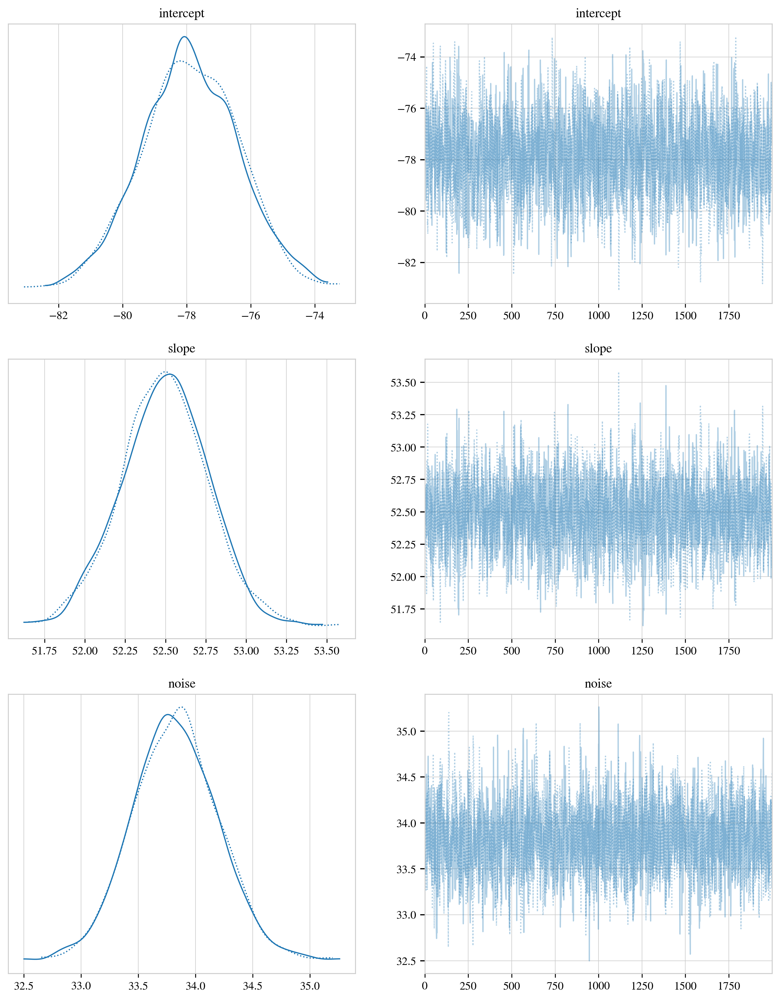

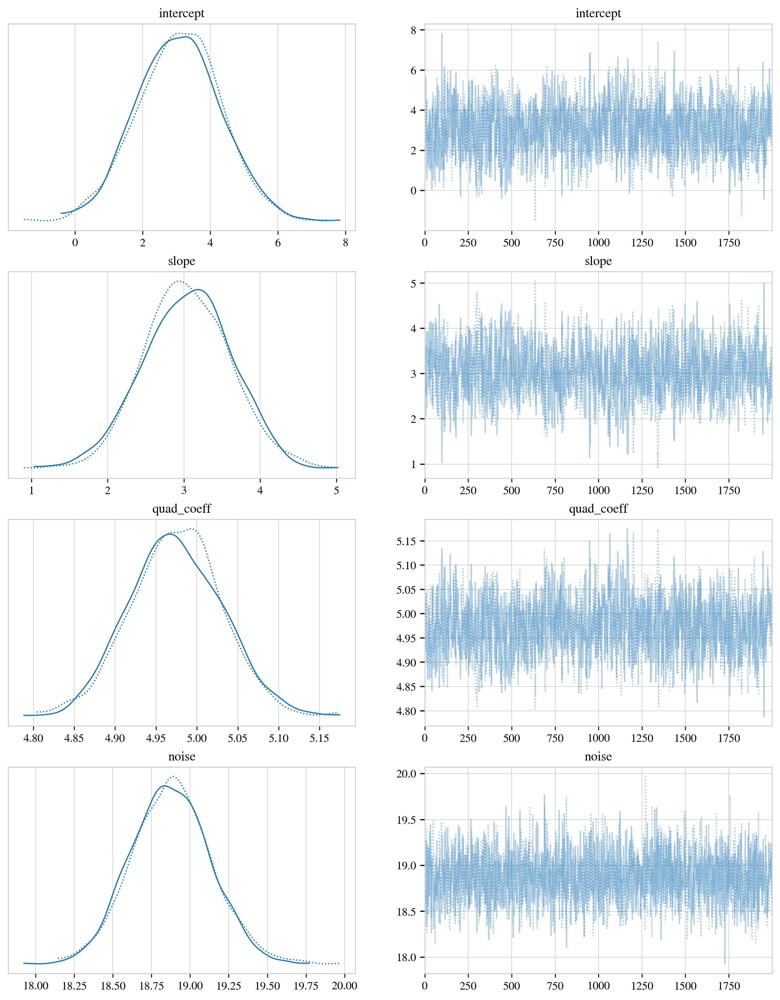

In [ ]:
# Posterior check distribution
pm.plot_trace(linear_trace, var_names=['intercept', 'slope', 'noise'], figsize=(12, 15))
plt.show()

pm.plot_trace(quad_trace, var_names=['intercept', 'slope', 'quad_coeff', 'noise'], figsize=(12, 15))
plt.show()

In [ ]:
# Generate new data using the parameters of the updated models.
with linear_model:
    post_pred_linear = pm.sample_posterior_predictive(linear_trace)

with quad_model:
    post_pred_quad = pm.sample_posterior_predictive(quad_trace)

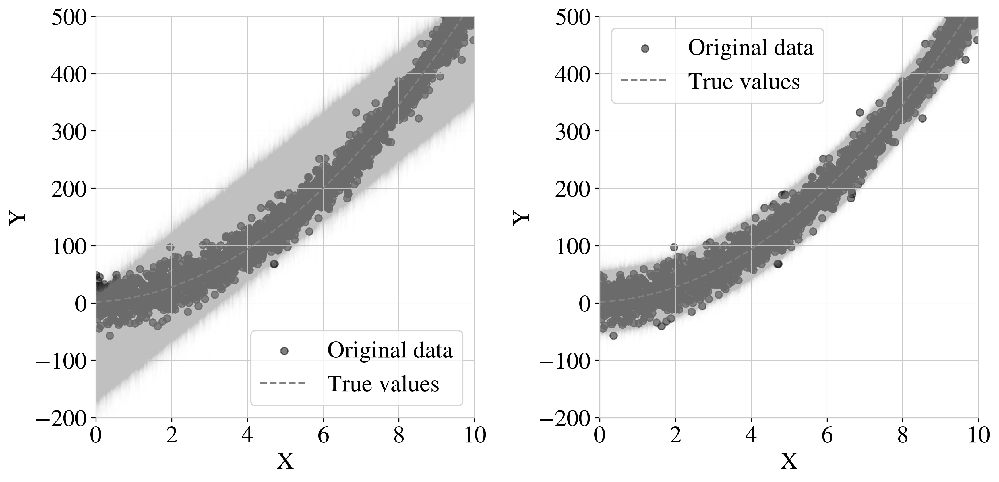

In [ ]:
# Plotting the generated data together with the original data
plt.figure(figsize=(12, 6))

# Original data and linear model
plt.subplot(1, 2, 1)
plt.scatter(x, y, label='Original data', color='k', alpha=0.5)
plt.plot(x, true_intercept + true_slope * x + true_quad_coeff * x**2, color='gray', linestyle='--', label='True values')
plt.plot(x, post_pred_linear.posterior_predictive['y_linear'][0,:,:].T, color='silver', alpha=0.01)
# plt.title('Linear model')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim([0, 10])
plt.ylim([-200, 500])
plt.legend()

# Original data and quadratic model
plt.subplot(1, 2, 2)
plt.scatter(x, y, label='Original data', color='k', alpha=0.5)
plt.plot(x, true_intercept + true_slope * x + true_quad_coeff * x**2, color='gray', linestyle='--', label='True values')
plt.plot(x, post_pred_quad.posterior_predictive['y_quad'][0,:,:].T, color='silver', alpha=0.01)
# plt.title('Quadratic model')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim([0, 10])
plt.ylim([-200, 500])
plt.legend()

plt.tight_layout()
plt.show()

# Prueba de escritorio #2

In [ ]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)

%config InlineBackend.figure_format = 'retina'
# az.style.use("arviz-darkgrid")

Generating Data

In [ ]:
size = 2000
x = np.linspace(0, 2, size)
y = np.zeros(len(x))

In [ ]:
# labels = ['First Order', 'Third Order', 'Fifth Order', 'Seventh Order']

# plt.figure(figsize = (10,8))
# for n, label in zip(range(4), labels):
#     y = y + ((-1)**n * (x)**(2*n+1)) / np.math.factorial(2*n+1)
#     plt.plot(x,y, label = label)

# plt.plot(x, np.sin(x), 'k', label = 'Analytic')
# plt.grid()
# plt.title('Taylor Series Approximations of Various Orders')
# plt.xlabel('x')
# plt.ylabel('y')
# plt.legend()
# plt.show()

In [ ]:
true_a = 4
true_b = 2

In [ ]:
true_values = true_a*np.sin(true_b*x)

sigma = 0.3
noise = np.random.randn(size)*sigma
# add noise
noisy_values = true_values + noise

data = pd.DataFrame(dict(x=x, y=y))

In [ ]:
fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(111, xlabel="X", ylabel="Y", title="Generated data and underlying model")
ax = fig.add_subplot(111, xlabel="$x$", ylabel="$f(x)$")

ax.plot(x, noisy_values, ".", label="Sampled data", color='k')
ax.plot(x, true_values, color='silver', label="True regression line", lw=2.0)

plt.xlim([0, 2])
plt.ylim([-6, 6])
plt.legend(loc=0);

ax.grid(which='minor', alpha=0.2)
ax.yaxis.grid(True, which='minor')
ax.xaxis.set_minor_locator(MultipleLocator(0.05))
ax.yaxis.set_minor_locator(MultipleLocator(1))

plt.show()

Defining Taylor Series

In [ ]:
y = np.zeros(size)

In [ ]:
# Taylor approximation at x0 of the function 'function'
def taylor(a, b, i, size):
    y = np.zeros(size)
    for n in range(i):
      y = y + a*(((-1)**n * (b*x)**(2*n+1)) / np.math.factorial(2*n+1))
    return y

In [ ]:
taylor5_ex = taylor(true_a, true_b, 5, size)

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111, xlabel="X", ylabel="Y", title="Generated data and underlying model")
ax.plot(x, noisy_values, ".", label="Sampled data", color='k')
ax.plot(x, taylor5_ex, label="Maclaurin Series of degree 5", color='gray')

plt.xlim([0, 2])
plt.ylim([-6, 6])
plt.legend(loc=0);

ax.grid(which='minor', alpha=0.2)
ax.yaxis.grid(True, which='minor')
ax.xaxis.set_minor_locator(MultipleLocator(0.05))
ax.yaxis.set_minor_locator(MultipleLocator(1))

plt.show()

Analyzing the model

In [ ]:
# Definir el modelo lineal
with pm.Model() as taylor3_model:
    # Priors
    A = pm.Normal('A', mu=0, sigma=10)
    B = pm.Normal('B', mu=0, sigma=10)
    noise = pm.HalfNormal('noise', sigma=1)

    # Modelo grado 3
    taylor3 = taylor(A, B, 3, size)

    # Likelihood
    likelihood = pm.Normal('y_taylor3', mu=taylor3, sigma=noise, observed=noisy_values)

    # Sample
    taylor3_trace = pm.sample(1000, tune=500)

with pm.Model() as taylor5_model:
    # Priors
    A = pm.Normal('A', mu=1, sigma=10)
    B = pm.Normal('B', mu=1, sigma=10)
    noise = pm.HalfNormal('noise', sigma=1)

    # Modelo grado 5
    taylor5 = taylor(A, B, 5, size)

    # Likelihood
    likelihood = pm.Normal('y_taylor5', mu=taylor5, sigma=noise, observed=noisy_values)

    # Sample
    taylor5_trace = pm.sample(1000, tune=500)

with pm.Model() as sinx_model:
    # Priors
    A = pm.Normal('A', mu=1, sigma=10)
    B = pm.Normal('B', mu=1, sigma=10)
    noise = pm.HalfNormal('noise', sigma=1)

    # Modelo grado 5
    sin_model = A*np.sin(B*x)

    # Likelihood
    likelihood = pm.Normal('y_sinx', mu=sin_model, sigma=noise, observed=noisy_values)

    # Sample
    sin_trace = pm.sample(1000, tune=500)

In [ ]:
# fig = plt.figure(figsize=(30,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(taylor3_trace.posterior.A[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('A')
plt.ylabel('PDF')
plt.xlim([2.45, 2.85])
plt.ylim([0, 8])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.01))
ax1.yaxis.set_minor_locator(MultipleLocator(0.2))

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

ax2 = az.plot_dist(taylor3_trace.posterior.B[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('B')
plt.ylabel('PDF')
plt.xlim([1.66, 1.76])
plt.ylim([0, 40])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.005))
ax2.yaxis.set_minor_locator(MultipleLocator(1))

plt.show()

# # Tercer  subgráfico
# plt.subplot(1, 3, 3)

ax3 = az.plot_dist(taylor3_trace.posterior.noise[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('Sigma')
plt.ylabel('PDF')
plt.xlim([1.65, 1.90])
plt.ylim([0, 14])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(1))
ax3.yaxis.set_minor_locator(MultipleLocator(1))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

In [ ]:
# fig = plt.figure(figsize=(30,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(taylor5_trace.posterior.A[0], rug=True, color='k')
# plt.title('Taylor Series of degree 5')
plt.xlabel('A')
plt.ylabel('PDF')
plt.xlim([3.97, 4.05])
plt.ylim([0, 40])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.005))
ax1.yaxis.set_minor_locator(MultipleLocator(1))

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

ax2 = az.plot_dist(taylor5_trace.posterior.B[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('B')
plt.ylabel('PDF')
plt.xlim([2.006, 2.020])
plt.ylim([0, 200])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.001))
ax2.yaxis.set_minor_locator(MultipleLocator(5))

plt.show()

# # Tercer  subgráfico
# plt.subplot(1, 3, 3)

ax3 = az.plot_dist(taylor5_trace.posterior.noise[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('Sigma')
plt.ylabel('PDF')
plt.xlim([0.285, 0.32])
plt.ylim([0, 100])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.001))
ax3.yaxis.set_minor_locator(MultipleLocator(5))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

In [ ]:
# fig = plt.figure(figsize=(30,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(sin_trace.posterior.A[0], rug=True, color='k')
# plt.title('Taylor Series of degree 5')
plt.xlabel('A')
plt.ylabel('PDF')
plt.xlim([3.97, 4.05])
plt.ylim([0, 50])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.005))
ax1.yaxis.set_minor_locator(MultipleLocator(2))

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

ax2 = az.plot_dist(sin_trace.posterior.B[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('B')
plt.ylabel('PDF')
plt.xlim([1.990, 2.006])
plt.ylim([0, 250])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.001))
ax2.yaxis.set_minor_locator(MultipleLocator(10))

plt.show()

# # Tercer  subgráfico
# plt.subplot(1, 3, 3)

ax3 = az.plot_dist(sin_trace.posterior.noise[0], rug=True, color='k')
# plt.title('Taylor Series of degree 3')
plt.xlabel('Sigma')
plt.ylabel('PDF')
plt.xlim([0.29, 0.32])
plt.ylim([0, 100])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.001))
ax3.yaxis.set_minor_locator(MultipleLocator(5))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

In [ ]:
# Generar nuevos datos utilizando los parámetros de los modelos ajustados
with taylor3_model:
    post_pred_taylor3 = pm.sample_posterior_predictive(taylor3_trace)
    # Perform MAP estimation
    taylor3_MAP = pm.find_MAP()

with taylor5_model:
    post_pred_taylor5 = pm.sample_posterior_predictive(taylor5_trace)
    # Perform MAP estimation
    taylor5_MAP = pm.find_MAP()

with sinx_model:
    post_pred_sin = pm.sample_posterior_predictive(sin_trace)
    # Perform MAP estimation
    sin_MAP = pm.find_MAP()

In [ ]:
plt.rcParams['figure.dpi'] = 200

In [ ]:
post_pred_taylor3.posterior_predictive['y_taylor3'][0,0,0]

In [ ]:
# Plotear los datos generados junto con los datos originales
plt.figure(figsize=(10,5))

# Datos originales y ajustes lineales
# plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
plt.plot(x, post_pred_taylor3.posterior_predictive['y_taylor3'][0,:,:].T, color='silver', alpha=0.01)
plt.plot(x, noisy_values, ".", label='Sampled data', color='k')
plt.plot([0, 0], [-0.99946254, 0], label='Maclaurin Series of Degree 3', color='silver')

# plt.title('Taylor Serie - Deg. 3')
plt.xlabel('$x$')
plt.ylabel('$f(x)$')
plt.xlim([0, 2])
plt.ylim([-7.5, 10])
plt.legend(loc="best")

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.05))
ax1.yaxis.set_minor_locator(MultipleLocator(1))

plt.tight_layout()
plt.show()

In [ ]:
# Plotear los datos generados junto con los datos originales
plt.figure(figsize=(10,5))

# Datos originales y ajustes lineales
# plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
plt.plot(x, post_pred_taylor5.posterior_predictive['y_taylor5'][0,:,:].T, color='silver')
plt.plot(x, noisy_values, ".", label='Sampled data', color='k')
plt.plot([0, 0], [-0.99946254, 0], label='Maclaurin Series of Degree 5', color='silver')

# plt.title('Taylor Serie - Deg. 5')
plt.xlabel('$x$')
plt.ylabel('$f(x)$')
plt.xlim([0, 2])
plt.ylim([-6, 6])
plt.legend(loc="best")

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.05))
ax3.yaxis.set_minor_locator(MultipleLocator(1))

plt.tight_layout()
plt.show()

In [ ]:
# Plotear los datos generados junto con los datos originales
plt.figure(figsize=(10,5))

# Datos originales y ajustes lineales
# plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
plt.plot(x, post_pred_sin.posterior_predictive['y_sinx'][0,:,:].T, color='silver')
plt.plot([0, 0], [-0.99946254, 0], label='$Sin(x)$', color='silver')
plt.plot(x, noisy_values, ".", label='Sampled data', color='k')

# plt.title('Sin(x)')
plt.xlabel('$x$')
plt.ylabel('$f(x)$')
plt.xlim([0, 2])
plt.ylim([-6, 6])
plt.legend(loc="best")

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.05))
ax3.yaxis.set_minor_locator(MultipleLocator(1))

plt.tight_layout()
plt.show()

In [ ]:
# post_pred_linear.posterior_predictive['y_linear'][0,:,:]

# Viga Simple EQ (Ejemplo #1)

In [ ]:
import numpy as np

In [ ]:
P = np.arange(0, 51, 0.1)
E_real = 24000 # MPa

In [ ]:
P.size

510

In [ ]:
sigma = 0.5
noise = np.random.randn(P.size)*sigma

In [ ]:
noise.std()

In [ ]:
noise.mean()

In [ ]:
def BasicBeam(P, Ebeam):

    E = Ebeam
    W = 8
    # P = np.array([35, 45, 60, 70, 100, 12, 18, 42, 34, 7, 27, 19, 10, 30, 52, 71, 102, 13, 28, 41])

    L = 3.9
    I = 102e-6
    a = 1.3
    b = 2.6
    x = 1.3

    # Loading I

    T_A_1 = -W*L**3/(24*E*I)
    y_c_1 = -W*(x**4-2*L*x**3+L**3*x)/(24*E*I)

    # Loading II

    T_A_2 = -P*b*(L**2-b**2)/(6*E*I*L)
    y_c_2 = -P*a**2*b**2/(3*E*I*L)

    Theta_A = T_A_1 + T_A_2
    y_c = y_c_1 + y_c_2


    # # Desplazamientos

    # Desplazamientos = np.transpose(np.array([Theta_A, y_c]))
    # Desplazamientos = np.reshape(Desplazamientos, (40, 1))

    return -y_c

In [ ]:
P = np.arange(0, 51, 0.1)
E_real = 24000 # MPa

sigma = 0.5
noise = np.random.randn(P.size)*sigma

def BasicBeam(P, Ebeam):

    E = Ebeam
    W = 8

    L = 3.9
    I = 102e-6
    a = 1.3
    b = 2.6
    x = 1.3

    # Loading I

    T_A_1 = -W*L**3/(24*E*I)
    y_c_1 = -W*(x**4-2*L*x**3+L**3*x)/(24*E*I)

    # Loading II

    T_A_2 = -P*b*(L**2-b**2)/(6*E*I*L)
    y_c_2 = -P*a**2*b**2/(3*E*I*L)

    Theta_A = T_A_1 + T_A_2
    y_c = y_c_1 + y_c_2

    return -y_c

In [ ]:
Desp_Teo = BasicBeam(P, 24e3)

print(Desp_Teo)

[ 8.55585512  8.59574256  8.63562999  8.67551743  8.71540487  8.7552923
  8.79517974  8.83506718  8.87495461  8.91484205  8.95472948  8.99461692
  9.03450436  9.07439179  9.11427923  9.15416667  9.1940541   9.23394154
  9.27382898  9.31371641  9.35360385  9.39349129  9.43337872  9.47326616
  9.51315359  9.55304103  9.59292847  9.6328159   9.67270334  9.71259078
  9.75247821  9.79236565  9.83225309  9.87214052  9.91202796  9.9519154
  9.99180283 10.03169027 10.07157771 10.11146514 10.15135258 10.19124001
 10.23112745 10.27101489 10.31090232 10.35078976 10.3906772  10.43056463
 10.47045207 10.51033951 10.55022694 10.59011438 10.63000182 10.66988925
 10.70977669 10.74966412 10.78955156 10.829439   10.86932643 10.90921387
 10.94910131 10.98898874 11.02887618 11.06876362 11.10865105 11.14853849
 11.18842593 11.22831336 11.2682008  11.30808824 11.34797567 11.38786311
 11.42775054 11.46763798 11.50752542 11.54741285 11.58730029 11.62718773
 11.66707516 11.7069626  11.74685004 11.78673747 11.8

In [ ]:
# add noise
Desp_Exp = Desp_Teo + noise

<Figure size 3000x1500 with 0 Axes>

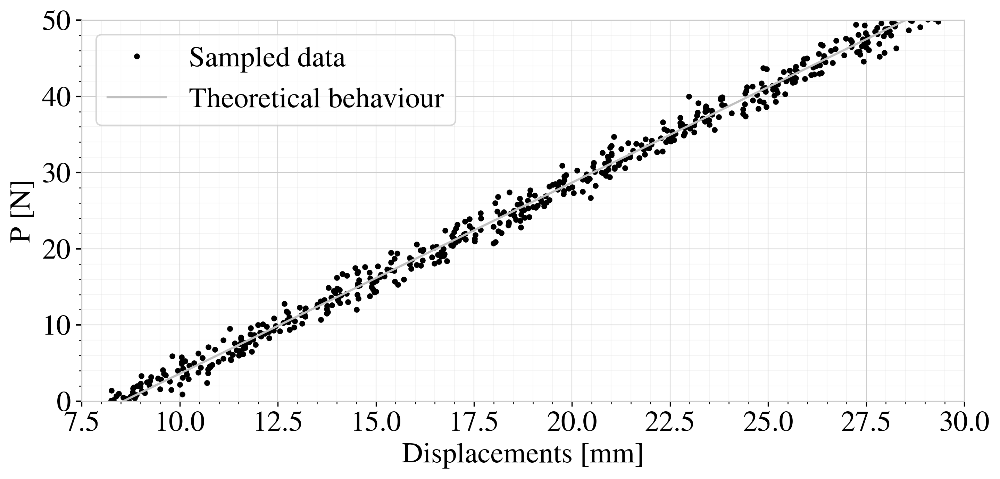

In [ ]:
# Plotear los datos generados junto con los datos originales
fig, ax = plt.subplots(figsize=(10,5))

# Datos originales y ajustes lineales
ax.plot(Desp_Exp, P, ".", label='Sampled data', color='k')
ax.plot(Desp_Teo, P, label='Theoretical behaviour', color='silver')

# plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
# plt.plot(x, post_pred_sin.posterior_predictive['y_sinx'][0,:,:].T, color='silver', alpha=0.01)

ax.set_xlabel('Displacements [mm]')
ax.set_ylabel('P [N]')
ax.set_xlim([7.5, 30])
ax.set_ylim([0, 50])
ax.legend(loc="best")

ax.grid(which='minor', alpha=0.2)
ax.yaxis.grid(True, which='minor')
ax.xaxis.set_minor_locator(MultipleLocator(0.5))
ax.yaxis.set_minor_locator(MultipleLocator(2))


plt.tight_layout()
plt.show()

In [ ]:
with pm.Model() as Model_BasicBeam:
    # Priors
    E = pm.Normal('Modulus', mu=20000, sigma=10000)
    noise = pm.HalfNormal('Sigma', sigma=1)

    # Modelo grado 5
    Model_BB = BasicBeam(P, E)

    # Likelihood
    likelihood = pm.Normal('y_BasicBeam', mu=Model_BB, sigma=noise, observed=Desp_Exp)

    # Sample
    BasicBeam_trace = pm.sample(1000, tune=500)

In [ ]:
BasicBeam_trace.posterior.Modulus[0]

<xarray.DataArray 'Modulus' (draw: 1000)>
array([23984.79053868, 23990.76896928, 23993.90408848, 23993.36261473,
       23954.66464388, 24004.35373137, 23997.03854189, 24011.88253767,
       24019.82060079, 23984.85153565, 23960.96771705, 23963.60302903,
       23995.3830023 , 23967.07451803, 23979.59075849, 23967.99330599,
       24007.21515837, 23956.60811144, 23969.22298276, 23966.38039694,
       24010.20582823, 23938.79941821, 24002.48563782, 24003.13447694,
       23989.24842133, 23978.27496847, 23942.1681125 , 23942.01993658,
       23973.31206274, 23946.0086997 , 23979.74452254, 23984.35836954,
       23994.26573221, 24027.93396439, 24008.16750494, 23951.30152623,
       23998.87067736, 23991.44813291, 24001.09553541, 23950.610564  ,
       23975.27547085, 23977.75068129, 23967.07737774, 23998.14235425,
       24041.73708244, 23923.17765862, 23920.0157324 , 23975.20507615,
       23981.56357771, 23951.58220752, 24015.8082995 , 24013.55299735,
       23943.5569979 , 23943.56216234, 23952.73388042, 23978.50617295,
       24005.70547773, 23983.31734203, 23934.53450234, 23915.07562648,
       24032.15209715, 24009.79372046, 24014.6432185 , 24027.1831502 ,
       23990.74313388, 23974.65449327, 23993.7843121 , 24005.11943115,
       24004.53698286, 23970.71958687, 23988.81563624, 23953.57984614,
       23995.26848893, 23963.84324236, 24026.12699601, 23963.1762678 ,
       23979.20348943, 23980.75540912, 24002.17634431, 23968.5819466 ,
...
       23980.90453568, 23997.21401762, 23969.55704631, 23980.50983974,
       23993.69316763, 23992.54177592, 24036.65217646, 23993.33075788,
       23969.63561607, 24035.75704148, 24022.2289969 , 23982.97453021,
       23982.9724996 , 23982.9724996 , 23976.42536161, 24002.22156741,
       24013.62511722, 23982.59904492, 24004.69389308, 23982.74799432,
       24022.97614333, 23929.82302009, 23971.34471623, 23899.3752983 ,
       23980.73901451, 23977.3160574 , 23996.93758114, 23987.48321347,
       23964.56804773, 23956.60814479, 23990.77284864, 23965.26027004,
       23963.83315293, 23980.08789117, 23984.92547331, 23988.37742203,
       23969.72632084, 23997.16215347, 24014.80351663, 24025.23293247,
       24005.64671306, 23995.98685568, 23994.45631747, 23930.6025622 ,
       23917.50629726, 23953.33923986, 23979.94880511, 23971.63523984,
       23995.24844535, 23976.41166805, 24000.06849556, 23949.41819356,
       23958.34984386, 24025.99275391, 23990.81200734, 23948.22194081,
       23961.03703494, 23967.54223818, 23967.82520571, 23945.1249759 ,
       23928.50709951, 23941.28124866, 23932.10737184, 23936.95909312,
       23969.29461396, 23994.86870221, 23991.4630457 , 23944.4803633 ,
       23946.34443967, 23947.21549313, 23981.69535389, 23973.8739527 ,
       23965.19817122, 23952.82769052, 23979.31755357, 23947.34153427,
       23978.58532976, 23946.32387809, 23956.67144323, 23975.33746096])
Coordinates:
    chain    int64 0
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


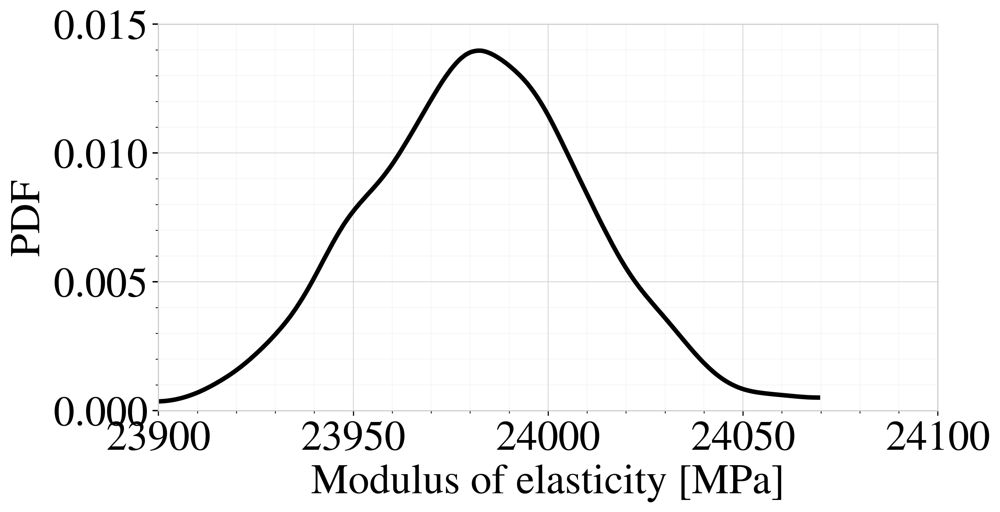

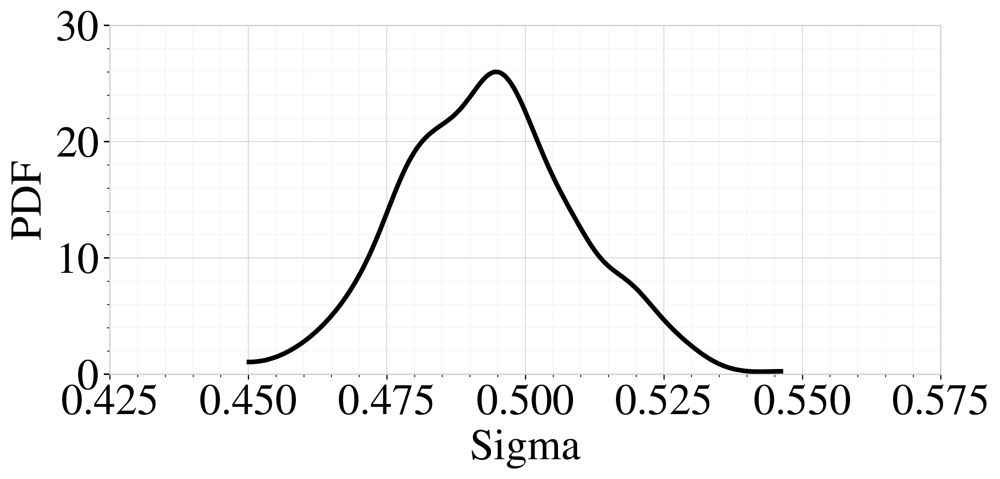

In [ ]:
fig = plt.figure(figsize=(10,5))

ax1 = az.plot_dist(BasicBeam_trace.posterior.Modulus[0], rug=True, color='k', textsize=30)
plt.xlabel('Modulus of elasticity [MPa]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([23900, 24100])
plt.ylim([0, 0.015])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(10))
ax1.yaxis.set_minor_locator(MultipleLocator(0.001))

plt.show()

fig = plt.figure(figsize=(10,5))

# Segundo  subgráfico

ax2 = az.plot_dist(BasicBeam_trace.posterior.Sigma[0], rug=True, color='k', textsize=30)
plt.xlabel('Sigma', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([0.425, 0.575])
plt.ylim([0, 30])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.005))
ax2.yaxis.set_minor_locator(MultipleLocator(2))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

In [ ]:
# Generar nuevos datos utilizando los parámetros de los modelos ajustados
with Model_BasicBeam:
    post_pred_BasicBeam = pm.sample_posterior_predictive(BasicBeam_trace)
    # Perform MAP estimation
    BasicBeam_MAP = pm.find_MAP()

In [ ]:
post_pred_BasicBeam

Inference data with groups:
	> posterior_predictive
	> observed_data

In [ ]:
plt.rcParams['figure.dpi'] = 200

In [ ]:
post_pred_BasicBeam.posterior_predictive['y_BasicBeam'][0,0,0]

<xarray.DataArray 'y_BasicBeam' ()>
array(9.03957147)
Coordinates:
    chain              int64 0
    draw               int64 0
    y_BasicBeam_dim_2  int64 0

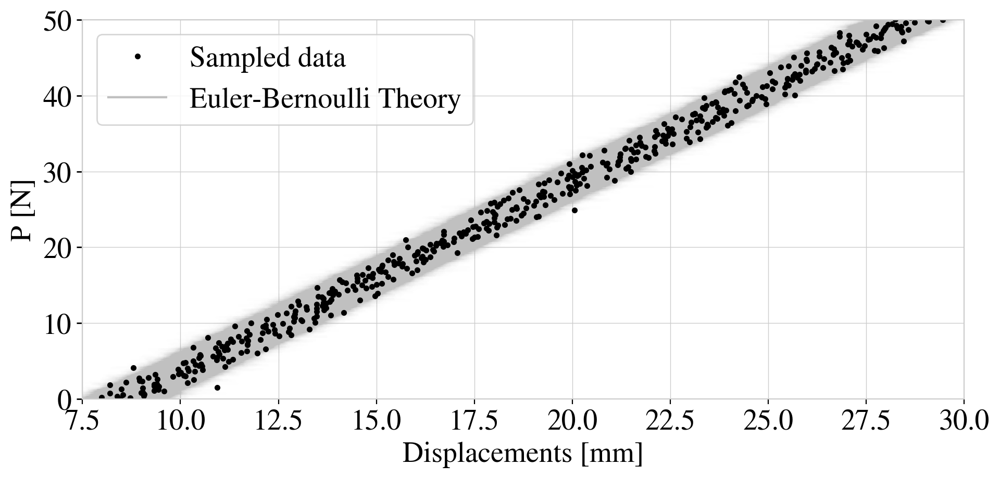

In [ ]:
# Plotear los datos generados junto con los datos originales
plt.figure(figsize=(10,5))

# Datos originales y ajustes lineales
# plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
plt.plot(post_pred_BasicBeam.posterior_predictive['y_BasicBeam'][0,:,:].T, P, color='silver', alpha=0.01)
plt.plot(Desp_Exp, P, ".", label='Sampled data', color='k')
plt.plot([0, 0], [-0.99946254, 0], label='Euler-Bernoulli Theory', color='silver')

# plt.title('Taylor Serie - Deg. 3')
plt.xlabel('Displacements [mm]')
plt.ylabel('P [N]')
plt.xlim([7.5, 30])
plt.ylim([0, 50])
plt.legend(loc="best")

# ax1.grid(which='minor', alpha=0.2)
# ax1.yaxis.grid(True, which='minor')
# ax1.xaxis.set_minor_locator(MultipleLocator(0.5))
# ax1.yaxis.set_minor_locator(MultipleLocator(2))

plt.tight_layout()
plt.show()

<Figure size 2000x1000 with 0 Axes>

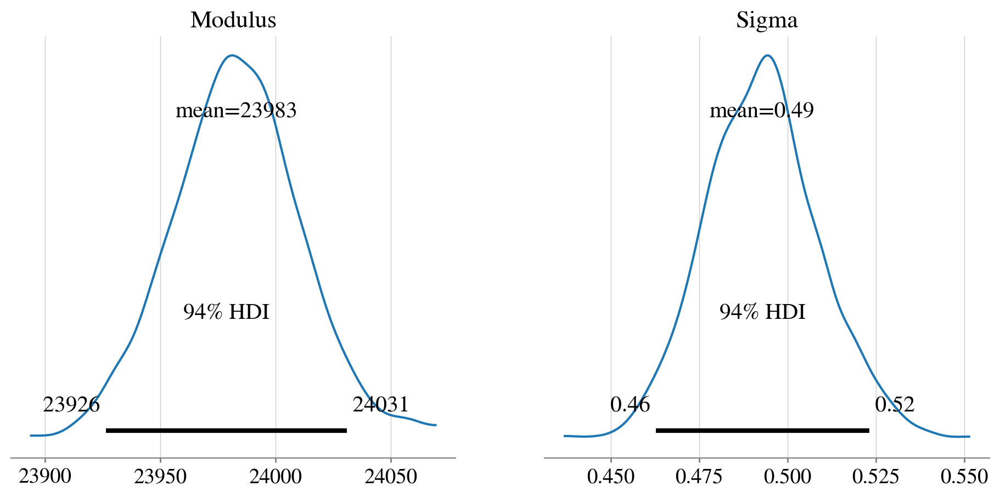

In [ ]:
axes = az.plot_posterior(
    BasicBeam_trace,
    var_names=["Modulus", "Sigma"],
    figsize=(11.5, 5),
)

fig = axes.flatten()[0].get_figure()
# fig.suptitle("Centered Eight: mu and theta for Choate")

plt.show()

In [ ]:
# az.to_netcdf(idata, DirName+'/TraceAA')

In [ ]:
# trace = az.from_netcdf(DirName+'TraceAA')
# az.plot_trace(trace)

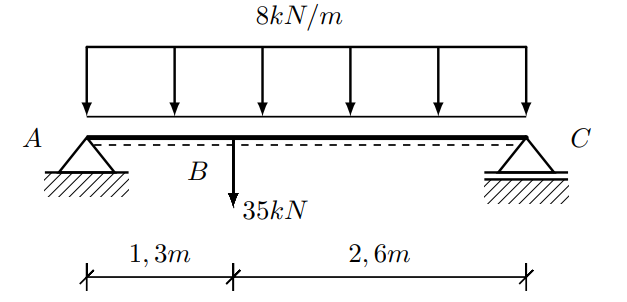

# Viga Simple OP (Ejemplo #2)

In [ ]:
!pip install --upgrade openseespy

In [ ]:
import numpy as np
import subprocess
from openseespy.opensees import *
import math

In [ ]:
def BasicBeamOP(P, input):

    Ebeam = input[0]

    Desplazamientos = [0]

    for i in range(len(P)):

        meter = 1;
        N = 1;
        sec = 1;

        # Dependent units
        sq_meter = meter*meter;
        Pa = N/sq_meter;
        kPa = Pa/1000;

        # Constants
        g = 9.81*meter/(sec*sec);
        pi = math.acos(-1);

        # ------------------------------
        # Start of model generation
        # -----------------------------

        # remove existing model
        wipe()

        # set modelbuilder
        model('basic', '-ndm', 2, '-ndf', 3)

        # create nodes
        node(1, 0.0, 0.0)
        node(2, 1.3, 0.0)
        node(3, 1.95, 0.0)
        node(4, 3.9, 0.0)

        # set boundary condition

        fix(1, 1, 1, 0)
        fix(4, 0, 1, 0)

        # define materials
        uniaxialMaterial("Elastic", 1, Ebeam)

        # Define beams
        geomTransf('Linear', 1, 0, 0, 1);

        # define elements

        I = 102e-6
        lado = np.cbrt(12*I)
        Area = lado*lado

        element('elasticBeamColumn', 1, 1, 2, Area, Ebeam, I, 1)
        element('elasticBeamColumn', 2, 2, 3, Area, Ebeam, I, 1)
        element('elasticBeamColumn', 3, 3, 4, Area, Ebeam, I, 1)

        # create TimeSeries
        timeSeries("Linear", 1)

        # create a plain load pattern
        pattern("Plain", 1, 1)

        # Create the nodal load - command: load nodeID xForce yForce
        eleLoad('-ele', 1, '-type', '-beamUniform', -8.0)
        eleLoad('-ele', 2, '-type', '-beamUniform', -8.0)
        eleLoad('-ele', 3, '-type', '-beamUniform', -8.0)

        # Create the nodal load - command: load nodeID xForce yForce
        load(2, 0.0, float(-P[i]), 0.0)

        # ------------------------------
        # Start of analysis generation
        # ------------------------------

        # create SOE
        # system("BandSPD")

        system("FullGeneral")

        # create DOF number
        numberer("RCM")

        # create constraint handler
        constraints("Plain")

        # create integrator
        integrator("LoadControl", 1.0)

        # create algorithm
        algorithm("Linear")

        # create analysis object
        analysis("Static")

        # perform the analysis
        analyze(1)

        tz = nodeDisp(1,3)
        uy = nodeDisp(2,2)

        Desplazamientos = np.vstack((Desplazamientos, uy))

    Desplazamientos = np.delete(Desplazamientos, 0, 0)
    Desplazamientos = np.reshape(Desplazamientos, (510, 1))
    Desplazamientos = Desplazamientos.flatten()

    #     Desplazamientos = np.vstack((Desplazamientos, [tz, uy]))

    # Desplazamientos = np.delete(Desplazamientos, 0, 0)
    # Desplazamientos = np.reshape(Desplazamientos, (40, 1))

    return -Desplazamientos

In [ ]:
# P = np.array([35, 45, 60, 70, 100, 12, 18, 42, 34, 7, 27, 19, 10, 30, 52, 71, 102, 13, 28, 41])
# data = BasicBeam(P,24e3)

In [ ]:
data = Desp_Exp
data

array([ 8.70412117,  8.24958627,  8.311959  ,  8.63098431,  8.84918851,
        8.5553133 ,  8.73184853,  8.38394214,  8.89215534, 10.06800066,
        8.44358124,  9.10861539,  8.79542901,  9.02724659,  8.25868955,
        9.77715027,  9.49721301,  8.80951145,  8.82100359,  8.98818904,
        8.915258  ,  9.22559058, 10.00062164,  9.00085853, 10.68926635,
        9.1639215 ,  9.74296947,  9.2392223 ,  9.52117592, 10.22692306,
        9.44678082, 10.06940565,  9.26781968,  9.01907229,  9.63593877,
       10.17812411,  9.59294379, 10.71569901, 10.4717508 , 10.15853442,
        9.95213932,  9.56398864, 10.71431051, 10.08102901, 10.52835135,
       10.77970371, 10.76641479, 10.24270299, 10.82464809, 10.04233611,
       10.36031978, 10.04394199, 10.9805933 , 10.13498149, 11.3023377 ,
       11.29472829, 11.10459088, 10.57936532, 10.04682109,  9.80864073,
       11.50409035, 11.34992416, 11.60876311, 10.47269465, 11.23995236,
       11.83050924, 11.52279235, 11.44055185, 10.89237367, 11.62

In [ ]:
print(data.shape)

(510,)


In [ ]:
input = [24000]

Desp_Exp_2 = BasicBeamOP(P, input)
# Desp_Exp_2 = Desp_Exp_2.flatten()
Desp_Exp_2

array([ 8.55585512,  8.59574256,  8.63562999,  8.67551743,  8.71540487,
        8.7552923 ,  8.79517974,  8.83506718,  8.87495461,  8.91484205,
        8.95472948,  8.99461692,  9.03450436,  9.07439179,  9.11427923,
        9.15416667,  9.1940541 ,  9.23394154,  9.27382898,  9.31371641,
        9.35360385,  9.39349129,  9.43337872,  9.47326616,  9.51315359,
        9.55304103,  9.59292847,  9.6328159 ,  9.67270334,  9.71259078,
        9.75247821,  9.79236565,  9.83225309,  9.87214052,  9.91202796,
        9.9519154 ,  9.99180283, 10.03169027, 10.07157771, 10.11146514,
       10.15135258, 10.19124001, 10.23112745, 10.27101489, 10.31090232,
       10.35078976, 10.3906772 , 10.43056463, 10.47045207, 10.51033951,
       10.55022694, 10.59011438, 10.63000182, 10.66988925, 10.70977669,
       10.74966412, 10.78955156, 10.829439  , 10.86932643, 10.90921387,
       10.94910131, 10.98898874, 11.02887618, 11.06876362, 11.10865105,
       11.14853849, 11.18842593, 11.22831336, 11.2682008 , 11.30

In [ ]:
print(Desp_Exp_2.shape)

(510,)


In [ ]:
def loglikeBasicBeam(theta, sigma0, P, data):#, sigma):
  # data: Datos observados
  # theta: Vector de parámetros a ajustar
  # model = runAnalizePYMC(P, theta[:-1], theta[-1])
  model = BasicBeamOP(P, theta)
  sigma = sigma0
  try:
    log = -np.sum(0.5 * (np.log(2 * np.pi * sigma ** 2) + ((data - model) / sigma) ** 2))
  except:
    log = -np.sum(0.5 * (np.log(2 * np.pi * sigma ** 2) + ((data - 0) / sigma) ** 2))
  return log

In [ ]:
logl = LogLike(loglikeBasicBeam, data, P)
with pm.Model() as m_VigaSimple:
  E = pm.Normal('E', mu=24e3 , sigma= 4e3)
  sigma = pm.HalfNormal('sigma')
  theta = pt.as_tensor_variable([E])
  ## -------------------------- LIKELIHOOD --------------------------
  pm.Potential("likelihood", logl(theta, sigma))
  ## -------------------------- STEP AND SAMPLE --------------------------
  # idata = pm.sample(chains = 2)
  idata = pm.sample(1000, tune=500)

In [ ]:
idata.posterior.E[0]

<xarray.DataArray 'E' (draw: 1000)>
array([23982.32152296, 23974.28247703, 23989.12082035, 23983.63890057,
       24001.47559969, 23989.43621931, 23965.10033594, 23974.37002736,
       23989.12953563, 23969.7105123 , 23949.72794991, 24010.15602624,
       24008.67521163, 23948.14106788, 24008.49844869, 24000.32996177,
       23982.55729077, 24014.03406359, 23958.22902801, 23978.739579  ,
       23973.27490708, 23975.10170323, 23996.15227077, 23961.3167236 ,
       24023.60626702, 23991.43028927, 23922.92989558, 23986.25685572,
       24002.75315517, 23971.53249743, 24001.68581823, 23971.39942281,
       23966.93383495, 23968.91665615, 24008.00499011, 23958.71449521,
       24008.58944865, 23960.21815336, 23978.37976365, 23976.50119227,
       24036.61443031, 23961.38856312, 23937.56228894, 23926.64373716,
       24028.71199454, 24037.61330775, 23955.58824016, 23970.5100934 ,
       24034.5478209 , 24012.32810997, 23972.39937086, 24004.38126224,
       23948.32848111, 23983.83390382, 23975.55807293, 24014.88464341,
       24014.36158048, 23982.83329234, 23964.41837674, 23999.04160411,
       23968.86183268, 23986.48848913, 23977.54594063, 23967.34147459,
       23990.08562378, 23970.42536227, 23944.7138442 , 23936.86875863,
       23987.48902717, 23999.91112895, 23964.17351764, 23960.49833335,
       23964.00543356, 23981.03229737, 23968.20426803, 23978.99522637,
       23968.63855294, 24020.40653827, 24008.52287324, 24005.46898682,
...
       23975.22077728, 23976.78346859, 23986.9167459 , 23981.19416968,
       23993.51597125, 23962.40620619, 23988.57624603, 23931.07326406,
       23996.53457254, 23976.21586746, 23986.90307835, 23971.37177197,
       23968.82333763, 23981.7792456 , 23970.08057448, 24009.58214732,
       23997.11193561, 23979.14248792, 23986.99635567, 23970.52632113,
       23950.56524196, 23970.40145569, 23985.97524409, 23977.4398833 ,
       23990.55559234, 23953.36358443, 23971.73785911, 23972.4149956 ,
       24045.86909064, 23980.27877958, 23990.80751092, 24005.94650642,
       24000.03051853, 23986.13545064, 24006.72418293, 23962.81012589,
       23970.52905901, 23968.52556094, 24007.84116641, 24035.79951043,
       23972.69288341, 23964.85096829, 23970.67537859, 23994.61668982,
       24003.34749868, 23988.75784854, 23972.10954375, 23996.7702651 ,
       23989.99204252, 23943.28499228, 23966.0559213 , 23982.46291726,
       23983.74267722, 23978.23209443, 23980.67231861, 23998.47120249,
       23995.1608899 , 23965.45771214, 23949.55494216, 23972.23167735,
       23998.46643569, 23965.80337933, 23954.25157501, 23960.25809751,
       23974.4929664 , 23966.47941185, 23957.35763883, 23971.35578419,
       23992.33335438, 23947.78973355, 24018.8468183 , 24021.80106533,
       23924.82595627, 23961.48293695, 23938.11383926, 23966.71173305,
       23976.99166797, 23986.11400399, 23984.12261356, 23982.51764512])
Coordinates:
    chain    int64 0
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999

<Figure size 3000x1500 with 0 Axes>

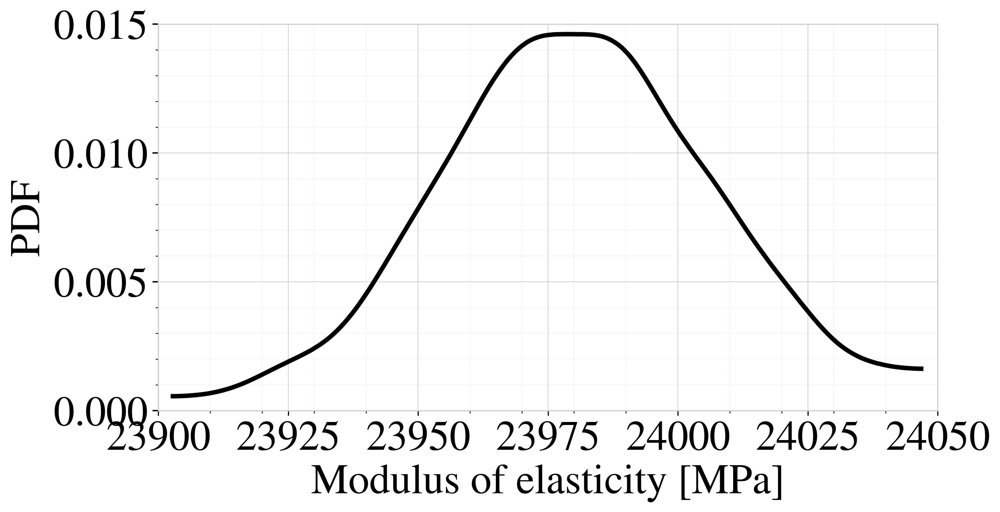

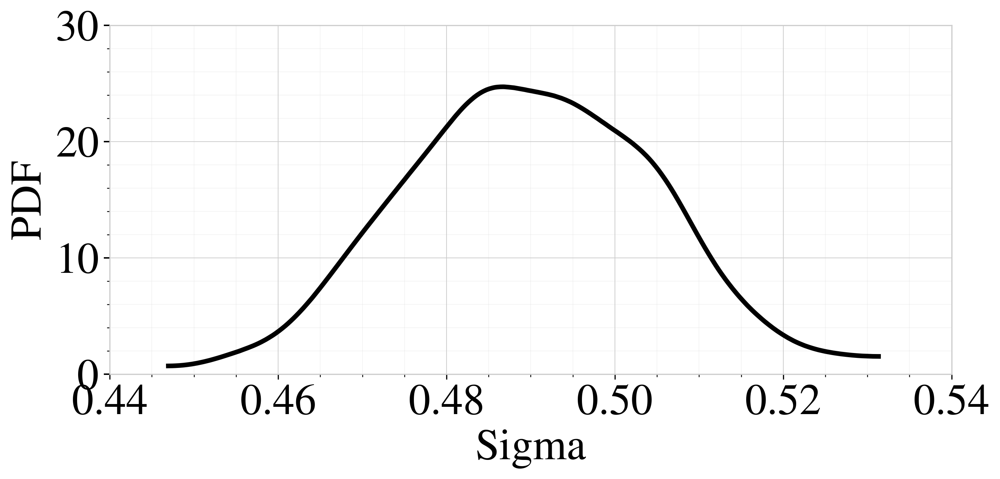

In [ ]:
fig = plt.figure(figsize=(10,5))

ax1 = az.plot_dist(idata.posterior.E[0], rug=True, color='k', textsize=30)
plt.xlabel('Modulus of elasticity [MPa]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([23900, 24050])
plt.ylim([0, 0.015])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(10))
ax1.yaxis.set_minor_locator(MultipleLocator(0.001))

plt.show()

fig = plt.figure(figsize=(10,5))

# Segundo  subgráfico

ax2 = az.plot_dist(idata.posterior.sigma[0], rug=True, color='k', textsize=30)
plt.xlabel('Sigma', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([0.44, 0.54])
plt.ylim([0, 30])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.005))
ax2.yaxis.set_minor_locator(MultipleLocator(2))

# Ajustar el diseño de los subgráficos
plt.tight_layout()

plt.show()

In [ ]:
# Generar nuevos datos utilizando los parámetros de los modelos ajustados
with m_VigaSimple:
    post_pred_m_VigaSimple = pm.sample_posterior_predictive(idata, extend_inferencedata=True)
    # # Perform MAP estimation
    # m_VigaSimple_MAP = pm.find_MAP()

In [ ]:
post_pred_m_VigaSimple

<xarray.Dataset>
Dimensions:  (chain: 2, draw: 1000)
Coordinates:
  * chain    (chain) int64 0 1
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
Data variables:
    E        (chain, draw) float64 2.398e+04 2.397e+04 ... 2.398e+04 2.395e+04
    sigma    (chain, draw) float64 0.4861 0.4825 0.4872 ... 0.4673 0.4721 0.4757
Attributes:
    created_at:                 2024-06-26T17:51:33.863150
    arviz_version:              0.15.1
    inference_library:          pymc
    inference_library_version:  5.10.4
    sampling_time:              3373.100620508194
    tuning_steps:               500

In [ ]:
post_pred_m_VigaSimple.E[0,:]

<xarray.DataArray 'E' (draw: 1000)>
array([23982.32152296, 23974.28247703, 23989.12082035, 23983.63890057,
       24001.47559969, 23989.43621931, 23965.10033594, 23974.37002736,
       23989.12953563, 23969.7105123 , 23949.72794991, 24010.15602624,
       24008.67521163, 23948.14106788, 24008.49844869, 24000.32996177,
       23982.55729077, 24014.03406359, 23958.22902801, 23978.739579  ,
       23973.27490708, 23975.10170323, 23996.15227077, 23961.3167236 ,
       24023.60626702, 23991.43028927, 23922.92989558, 23986.25685572,
       24002.75315517, 23971.53249743, 24001.68581823, 23971.39942281,
       23966.93383495, 23968.91665615, 24008.00499011, 23958.71449521,
       24008.58944865, 23960.21815336, 23978.37976365, 23976.50119227,
       24036.61443031, 23961.38856312, 23937.56228894, 23926.64373716,
       24028.71199454, 24037.61330775, 23955.58824016, 23970.5100934 ,
       24034.5478209 , 24012.32810997, 23972.39937086, 24004.38126224,
       23948.32848111, 23983.83390382, 23975.55807293, 24014.88464341,
       24014.36158048, 23982.83329234, 23964.41837674, 23999.04160411,
       23968.86183268, 23986.48848913, 23977.54594063, 23967.34147459,
       23990.08562378, 23970.42536227, 23944.7138442 , 23936.86875863,
       23987.48902717, 23999.91112895, 23964.17351764, 23960.49833335,
       23964.00543356, 23981.03229737, 23968.20426803, 23978.99522637,
       23968.63855294, 24020.40653827, 24008.52287324, 24005.46898682,
...
       23975.22077728, 23976.78346859, 23986.9167459 , 23981.19416968,
       23993.51597125, 23962.40620619, 23988.57624603, 23931.07326406,
       23996.53457254, 23976.21586746, 23986.90307835, 23971.37177197,
       23968.82333763, 23981.7792456 , 23970.08057448, 24009.58214732,
       23997.11193561, 23979.14248792, 23986.99635567, 23970.52632113,
       23950.56524196, 23970.40145569, 23985.97524409, 23977.4398833 ,
       23990.55559234, 23953.36358443, 23971.73785911, 23972.4149956 ,
       24045.86909064, 23980.27877958, 23990.80751092, 24005.94650642,
       24000.03051853, 23986.13545064, 24006.72418293, 23962.81012589,
       23970.52905901, 23968.52556094, 24007.84116641, 24035.79951043,
       23972.69288341, 23964.85096829, 23970.67537859, 23994.61668982,
       24003.34749868, 23988.75784854, 23972.10954375, 23996.7702651 ,
       23989.99204252, 23943.28499228, 23966.0559213 , 23982.46291726,
       23983.74267722, 23978.23209443, 23980.67231861, 23998.47120249,
       23995.1608899 , 23965.45771214, 23949.55494216, 23972.23167735,
       23998.46643569, 23965.80337933, 23954.25157501, 23960.25809751,
       23974.4929664 , 23966.47941185, 23957.35763883, 23971.35578419,
       23992.33335438, 23947.78973355, 24018.8468183 , 24021.80106533,
       23924.82595627, 23961.48293695, 23938.11383926, 23966.71173305,
       23976.99166797, 23986.11400399, 23984.12261356, 23982.51764512])
Coordinates:
    chain    int64 0
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999

In [ ]:
# # Plotear los datos generados junto con los datos originales
# plt.figure(figsize=(10,5))

# # Datos originales y ajustes lineales
# # plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
# plt.plot(post_pred_m_VigaSimple.E[0,:].T, P, color='silver', alpha=0.01)
# plt.plot(noisy_values, P, ".", label='Sampled data', color='k')
# plt.plot([0, 0], [-0.99946254, 0], label='Openseespy Model', color='silver')

# # # plt.title('Taylor Serie - Deg. 3')
# # plt.xlabel('$x$')
# # plt.ylabel('$f(x)$')
# # plt.xlim([0, 2])
# # plt.ylim([-7.5, 10])
# # plt.legend(loc="best")

# # ax1.grid(which='minor', alpha=0.2)
# # ax1.yaxis.grid(True, which='minor')
# # ax1.xaxis.set_minor_locator(MultipleLocator(0.05))
# # ax1.yaxis.set_minor_locator(MultipleLocator(1))

# plt.tight_layout()
# plt.show()

ValueError: x and y must have same first dimension, but have shapes (1000,) and (510,)

In [ ]:
# # Plotear los datos generados junto con los datos originales
# plt.figure(figsize=(10,5))

# # Datos originales y ajustes lineales
# # plt.plot(x, true_values, color='gray', linestyle='--', label='True model')
# plt.plot(post_pred_m_VigaSimple.posterior_predictive['E'][0,:,:].T, P, color='silver', alpha=0.01)
# plt.plot(noisy_values, P, ".", label='Sampled data', color='k')
# plt.plot([0, 0], [-0.99946254, 0], label='Openseespy Model', color='silver')

# # # plt.title('Taylor Serie - Deg. 3')
# # plt.xlabel('$x$')
# # plt.ylabel('$f(x)$')
# # plt.xlim([0, 2])
# # plt.ylim([-7.5, 10])
# # plt.legend(loc="best")

# # ax1.grid(which='minor', alpha=0.2)
# # ax1.yaxis.grid(True, which='minor')
# # ax1.xaxis.set_minor_locator(MultipleLocator(0.05))
# # ax1.yaxis.set_minor_locator(MultipleLocator(1))

# plt.tight_layout()
# plt.show()

In [ ]:
# az.to_netcdf(idata, DirName+'/TraceBB')

In [ ]:
# trace = az.from_netcdf(DirName+'TraceBB')
# az.plot_trace(trace)

# Three-Story Building (Ejemplo #3)

In [ ]:
import numpy as np
import subprocess
from openseespy.opensees import *
import math

In [ ]:
P = np.arange(0, 51, 0.1)

In [ ]:
def Three_Story_Shear_Frame(input):

    E = input[0]

    # ------------------------------
    # Start of model generation
    # -----------------------------

    # Remove existing model
    wipe()

    # Set modelbuilder
    model('basic', '-ndm', 2, '-ndf', 3)

    h = 144
    L = 2*h

    # create nodes
    node(1, 0.0, 0.0)
    node(2, L, 0.0)
    node(3, 0.0, h)
    node(4, L, h)
    node(5, 0.0, 2*h)
    node(6, L, 2*h)
    node(7, 0.0, 3*h)
    node(8, L, 3*h)

    # Single point constraints -- Boundary Conditions

    fix(1, 1, 1, 1)
    fix(2, 1, 1, 1)

    # MP constraints
    equalDOF(3, 4, 2, 3)
    equalDOF(5, 6, 2, 3)
    equalDOF(7, 8, 2, 3)

    # Define materials
    uniaxialMaterial("Elastic", 1, E)

    # Define geometric transform
    geomTransf('Linear', 1, 0, 0, 1);

    # Define mass

    m = 100.0/386.0

    mass(3, m, 0.0, 0.0)
    mass(4, m, 0.0, 0.0)
    mass(5, m/2, 0.0, 0.0)
    mass(6, m/2, 0.0, 0.0)
    mass(7, m/2, 0.0, 0.0)
    mass(8, m/2, 0.0, 0.0)

    # Define elements

    # Columns

    Ac = 63.41
    Ic = 320.0

    element('elasticBeamColumn', 1, 1, 3, Ac, E, 2*Ic, 1)
    element('elasticBeamColumn', 2, 3, 5, Ac, E, Ic, 1)
    element('elasticBeamColumn', 3, 5, 7, Ac, E, Ic, 1)

    element('elasticBeamColumn', 4, 2, 4, Ac, E, 2*Ic, 1)
    element('elasticBeamColumn', 5, 4, 6, Ac, E, Ic, 1)
    element('elasticBeamColumn', 6, 6, 8, Ac, E, Ic, 1)

    # Beams

    Ib = 10e+12
    Ab = 63.41

    element('elasticBeamColumn', 7, 3, 4, Ab, E, Ib, 1)
    element('elasticBeamColumn', 8, 5, 6, Ab, E, Ib, 1)
    element('elasticBeamColumn', 9, 7, 8, Ab, E, Ib, 1)


    # Eigen Analysis -------------------------------------------------------------

    # Natural frequencies

    numModes = 5
    M_Lambda = eigen('-generalized','-fullGenLapack',numModes)


    F = [];

    for f in range(len(M_Lambda)):

        F.append(math.sqrt(M_Lambda[f])/(2*math.pi));

    F = np.transpose(np.array(F))

    # print("Shape", F.shape)

    Mode_1 = []

    Mode_1.append(nodeEigenvector(1, 1, 1))
    Mode_1.append(nodeEigenvector(2, 1, 1))
    Mode_1.append(nodeEigenvector(3, 1, 1))
    Mode_1.append(nodeEigenvector(4, 1, 1))
    Mode_1.append(nodeEigenvector(5, 1, 1))
    Mode_1.append(nodeEigenvector(6, 1, 1))
    Mode_1.append(nodeEigenvector(7, 1, 1))
    Mode_1.append(nodeEigenvector(8, 1, 1))

    Mode_2 = []

    Mode_2.append(nodeEigenvector(1, 2, 1))
    Mode_2.append(nodeEigenvector(2, 2, 1))
    Mode_2.append(nodeEigenvector(3, 2, 1))
    Mode_2.append(nodeEigenvector(4, 2, 1))
    Mode_2.append(nodeEigenvector(5, 2, 1))
    Mode_2.append(nodeEigenvector(6, 2, 1))
    Mode_2.append(nodeEigenvector(7, 2, 1))
    Mode_2.append(nodeEigenvector(8, 2, 1))

    Mode_3 = []

    Mode_3.append(nodeEigenvector(1, 3, 1))
    Mode_3.append(nodeEigenvector(2, 3, 1))
    Mode_3.append(nodeEigenvector(3, 3, 1))
    Mode_3.append(nodeEigenvector(4, 3, 1))
    Mode_3.append(nodeEigenvector(5, 3, 1))
    Mode_3.append(nodeEigenvector(6, 3, 1))
    Mode_3.append(nodeEigenvector(7, 3, 1))
    Mode_3.append(nodeEigenvector(8, 3, 1))

    Mode_1 = np.array(Mode_1)
    Mode_2 = np.array(Mode_2)
    Mode_3 = np.array(Mode_3)

    Var_Mod = np.hstack((F, Mode_1))
    Var_Mod = np.hstack((Var_Mod, Mode_2))
    Var_Mod = np.hstack((Var_Mod, Mode_3))

    Var_Mod = Var_Mod.flatten()

    Var_Mod = Var_Mod.T

    return F

In [ ]:
E_real = [26000] # MPa

# [F, Mode_1, Mode_2, Mode_3] = Three_Story_Shear_Frame(E_real)

# Var_Mod = np.hstack((F, Mode_1))

# Var_Mod

In [ ]:
Var_Mod = Three_Story_Shear_Frame(E_real)
Var_Mod

array([ 1.29287131,  2.97692874,  4.34637316, 33.60381915, 47.34299104])

In [ ]:
# F

array([1.29214163, 2.97696405, 4.34638586])

In [ ]:
# Mode_1

array([ 0.        ,  0.        , -0.44638529, -0.44638529, -1.11118179,
       -1.11118179, -1.49223168, -1.49223168])

In [ ]:
sigmaMod = 0.2
noiseMod = np.random.randn(Var_Mod.size)*sigmaMod

In [ ]:
# add noise
Var_Mod_Exp = Var_Mod + noiseMod
Var_Mod_Exp

array([ 1.47466714,  2.9853168 ,  4.35964089, 33.65635633, 47.39281269])

In [ ]:
# Var_Mod_Exp.shape

In [ ]:
# Mode_1_Exp, Mode_2_Exp, Mode_3_Exp = Mode_1 + noiseMode, Mode_2 + noiseMode, Mode_3 + noiseMode
# Mode_1_Exp

array([ 0.01096687,  0.00271005, -0.43163464, -0.44600152, -1.08896205,
       -1.06071362, -1.5002084 , -1.48906939])

In [ ]:
data = Var_Mod_Exp
# data = Var_Mod
data

array([ 1.47466714,  2.9853168 ,  4.35964089, 33.65635633, 47.39281269])

In [ ]:
def loglikeBuilding(theta, sigma0, P, data):#, sigma):
  # data: Datos observados
  # theta: Vector de parámetros a ajustar
  # model = runAnalizePYMC(P, theta[:-1], theta[-1])
  model = Three_Story_Shear_Frame(theta)
  sigma = sigma0
  try:
    log = -np.sum(0.5 * (np.log(2 * np.pi * sigma ** 2) + ((data - model) / sigma) ** 2))
  except:
    log = -np.sum(0.5 * (np.log(2 * np.pi * sigma ** 2) + ((data - 0) / sigma) ** 2))
  return log

In [ ]:
logl = LogLike(loglikeBuilding, data, P)
with pm.Model() as m_Building:
  E = pm.Normal('E', mu=28e3 , sigma= 2e3)
  sigma = pm.HalfNormal('sigma')
  theta = pt.as_tensor_variable([E])
  ## -------------------------- LIKELIHOOD --------------------------
  pm.Potential("likelihood", logl(theta, sigma))
  ## -------------------------- STEP AND SAMPLE --------------------------
  # idata = pm.sample(chains = 2)
  idata = pm.sample(1000, tune=500)

In [ ]:
# Initialize an empty list to store the first value of each result vector
values1 = []
values2 = []
values3 = []
values4 = []
values5 = []

In [ ]:
# Loop through each sample of E from the posterior
for e in idata.posterior.E[0].values:
    # Call the Three_Story_Shear_Frame model with the current value of E
    input_params = [e]
    result = Three_Story_Shear_Frame(input_params)

    # Extract the first value of the result vector and store it
    value1 = result[0]
    value2 = result[1]
    value3 = result[2]
    value4 = result[3]
    value5 = result[4]

    values1.append(value1)
    values2.append(value2)
    values3.append(value3)
    values4.append(value4)
    values5.append(value5)

    # # Print the model result for verification
    # print("Model result with E =", e, ":", result)

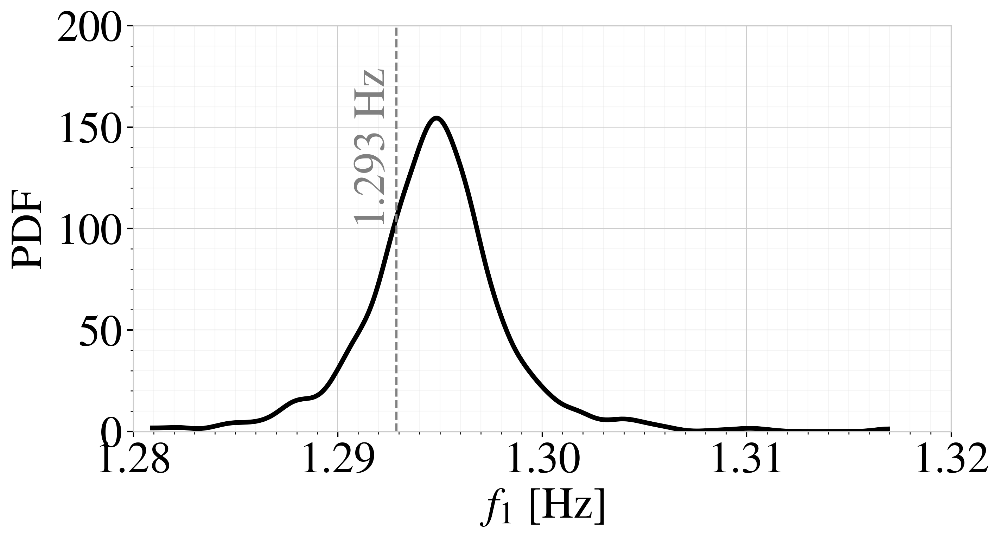

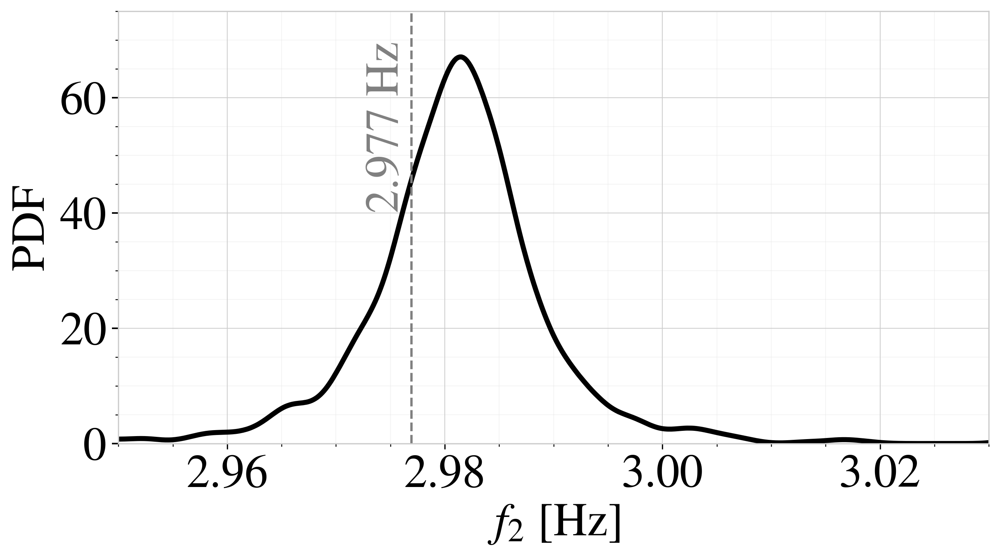

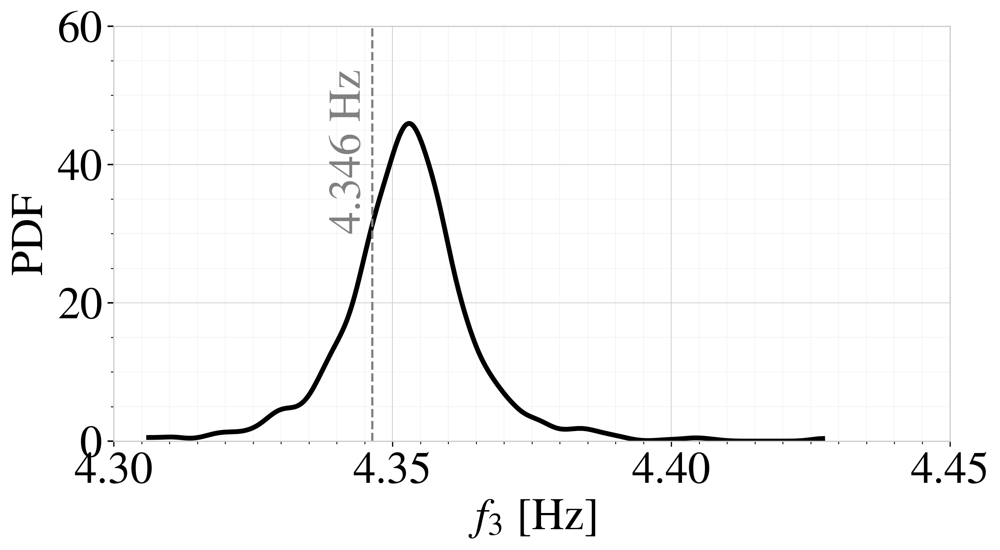

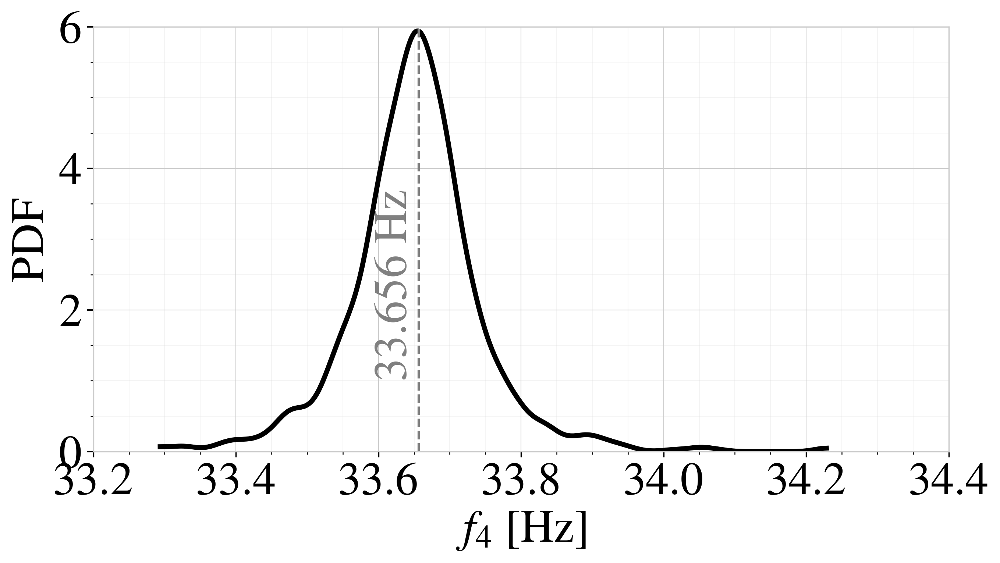

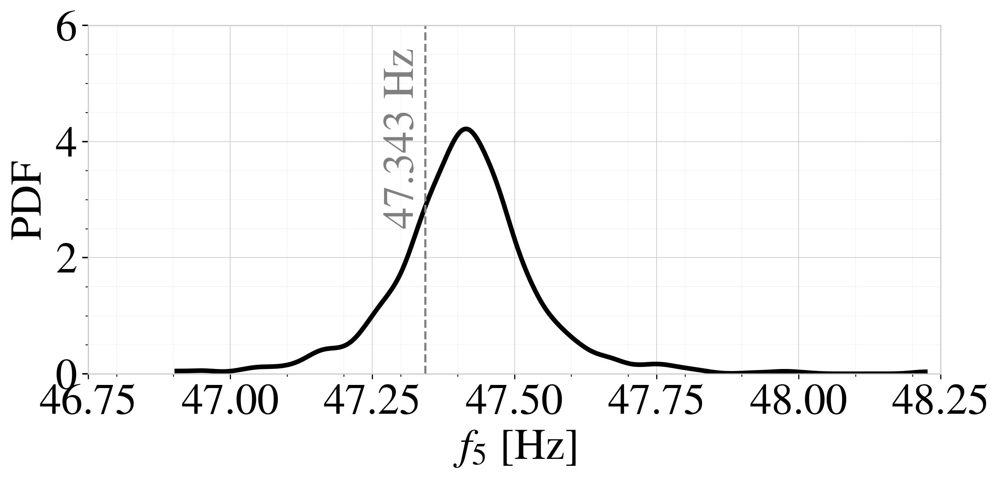

In [ ]:
fig = plt.figure(figsize=(10,5))

# # Primer subgráfico
# plt.subplot(1, 3, 1)

ax1 = az.plot_dist(values1, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$f_1$ [Hz]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([1.28, 1.32])
plt.ylim([0, 200])

ax1.grid(which='minor', alpha=0.2)
ax1.yaxis.grid(True, which='minor')
ax1.xaxis.set_minor_locator(MultipleLocator(0.001))
ax1.yaxis.set_minor_locator(MultipleLocator(10))

# Add vertical line at nominal value 1.30
plt.axvline(x=1.29287131, color='gray', linestyle='--')
plt.text(1.29287131*0.9999, 100, '1.293 Hz', rotation=90, verticalalignment='bottom', horizontalalignment='right', fontsize=30, color='gray')

plt.show()

# # Segundo  subgráfico
# plt.subplot(1, 3, 2)

fig = plt.figure(figsize=(10,5))

ax2 = az.plot_dist(values2, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$f_2$ [Hz]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([2.95, 3.03])
plt.ylim([0, 75])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.005))
ax2.yaxis.set_minor_locator(MultipleLocator(5))

# Add vertical line at nominal value 1.30
plt.axvline(x=2.97692874, color='gray', linestyle='--')
plt.text(2.97692874*0.9999, 40, '2.977 Hz', rotation=90, verticalalignment='bottom', horizontalalignment='right', fontsize=30, color='gray')

plt.show()

# # Tercer subgráfico
# plt.subplot(1, 3, 2)

fig = plt.figure(figsize=(10,5))

ax2 = az.plot_dist(values3, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$f_3$ [Hz]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([4.3, 4.45])
plt.ylim([0, 60])

ax2.grid(which='minor', alpha=0.2)
ax2.yaxis.grid(True, which='minor')
ax2.xaxis.set_minor_locator(MultipleLocator(0.005))
ax2.yaxis.set_minor_locator(MultipleLocator(5))

# Add vertical line at nominal value 1.30
plt.axvline(x=4.34637316, color='gray', linestyle='--')
plt.text(4.34637316*0.9999, 30, '4.346 Hz', rotation=90, verticalalignment='bottom', horizontalalignment='right', fontsize=30, color='gray')

plt.show()


# # Cuatro  subgráfico
# plt.subplot(1, 3, 3)

fig = plt.figure(figsize=(10,5))

ax3 = az.plot_dist(values4, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$f_4$ [Hz]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([33.2, 34.4])
plt.ylim([0, 6])

ax3.grid(which='minor', alpha=0.2)
ax3.yaxis.grid(True, which='minor')
ax3.xaxis.set_minor_locator(MultipleLocator(0.05))
ax3.yaxis.set_minor_locator(MultipleLocator(0.5))

# Add vertical line at nominal value 1.30
plt.axvline(x=33.65635633, color='gray', linestyle='--')
plt.text(33.65635633*0.9999, 1, '33.656 Hz', rotation=90, verticalalignment='bottom', horizontalalignment='right', fontsize=30, color='gray')

plt.show()

# # Quinto  subgráfico
# plt.subplot(1, 3, 3)

fig = plt.figure(figsize=(10,5))

ax5 = az.plot_dist(values5, rug=True, color='k', textsize=30)
# plt.title('Taylor Series of degree 3')
plt.xlabel('$f_5$ [Hz]', fontsize=30)
plt.ylabel('PDF', fontsize=30)
plt.xlim([46.75, 48.25])
plt.ylim([0, 6])

ax5.grid(which='minor', alpha=0.2)
ax5.yaxis.grid(True, which='minor')
ax5.xaxis.set_minor_locator(MultipleLocator(0.1))
ax5.yaxis.set_minor_locator(MultipleLocator(0.5))

# Add vertical line at nominal value 1.30
plt.axvline(x=47.34299104, color='gray', linestyle='--')
plt.text(47.34299104*0.9999, 2.5, '47.343 Hz', rotation=90, verticalalignment='bottom', horizontalalignment='right', fontsize=30, color='gray')

# Ajustar el diseño de los subgráficos
plt.tight_layout()
plt.show()


In [ ]:
# result

array([ 1.29329332,  2.97790045,  4.34779187, 33.61478787, 47.35844441])

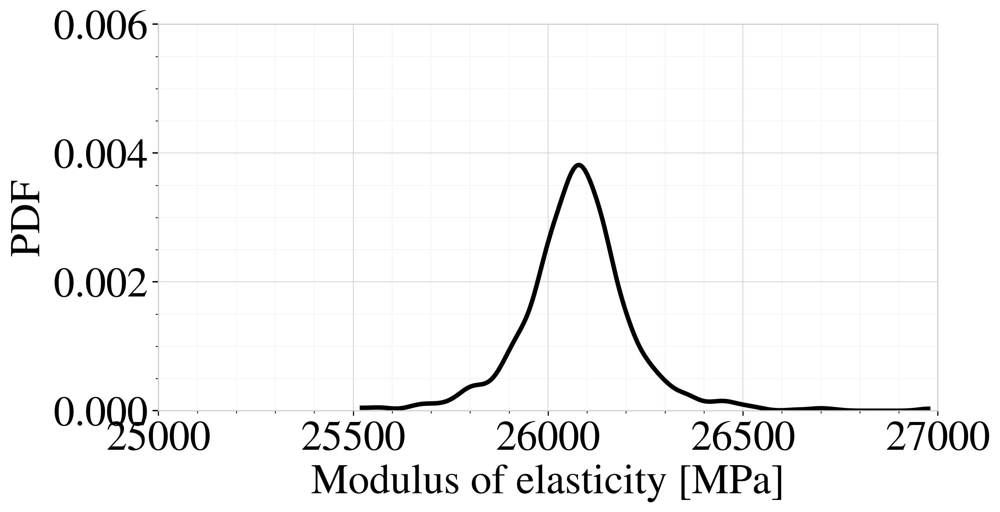

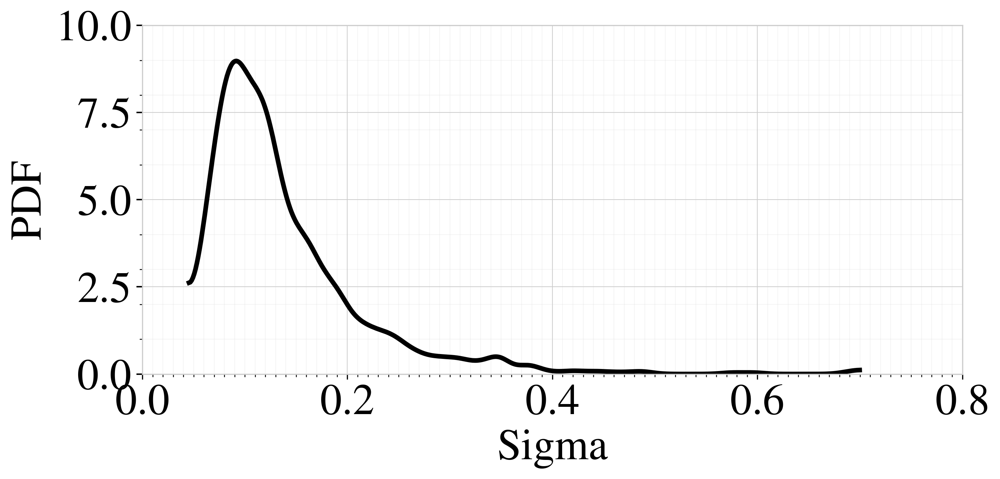

In [ ]:
# fig = plt.figure(figsize=(10,5))

# ax1 = az.plot_dist(idata.posterior.E[0], rug=True, color='k', textsize=30)
# plt.xlabel('Modulus of elasticity [MPa]', fontsize=30)
# plt.ylabel('PDF', fontsize=30)
# # plt.xlim([25000, 27000])
# # plt.ylim([0, 0.006])

# # ax1.grid(which='minor', alpha=0.2)
# # ax1.yaxis.grid(True, which='minor')
# # ax1.xaxis.set_minor_locator(MultipleLocator(100))
# # ax1.yaxis.set_minor_locator(MultipleLocator(0.0005))

# plt.show()

# fig = plt.figure(figsize=(10,5))

# # Segundo  subgráfico

# ax2 = az.plot_dist(idata.posterior.sigma[0], rug=True, color='k', textsize=30)
# plt.xlabel('Sigma', fontsize=30)
# plt.ylabel('PDF', fontsize=30)
# # plt.xlim([0, 0.8])
# # plt.ylim([0, 10])

# # ax2.grid(which='minor', alpha=0.2)
# # ax2.yaxis.grid(True, which='minor')
# # ax2.xaxis.set_minor_locator(MultipleLocator(0.01))
# ax2.yaxis.set_minor_locator(MultipleLocator(1))

# # Ajustar el diseño de los subgráficos
# plt.tight_layout()

# plt.show()

<ipython-input-2-4ef3f9cbb8a3>:25: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi = az.hdi(posterior_predictions, hdi_prob=0.94)


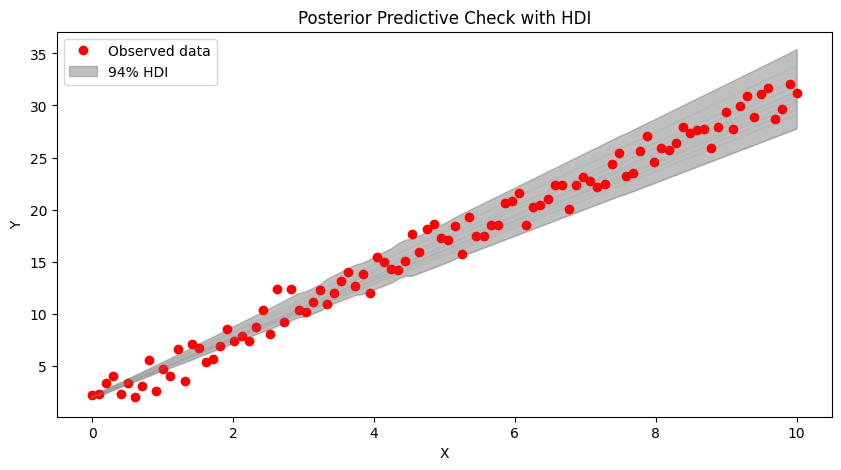

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import arviz as az

# # Example function to generate predictions (replace with your model's prediction function)
# def generate_predictions(params, x):
#     # Placeholder for actual prediction logic
#     # For example, if your model is a simple linear regression:
#     intercept, slope = params
#     predictions = intercept + slope * x
#     return predictions

# # Example observed data
# x_observed = np.linspace(0, 10, 100)
# observed_data = 2.0 + 3.0 * x_observed + np.random.normal(scale=1.0, size=x_observed.shape)

# # Example posterior samples
# num_samples = 1000
# posterior_samples = np.random.normal(loc=[2.0, 3.0], scale=[0.1, 0.2], size=(num_samples, 2))

# # Generate posterior predictive samples
# posterior_predictions = np.array([generate_predictions(params, x_observed) for params in posterior_samples])

# # Calculate HDI
# hdi = az.hdi(posterior_predictions, hdi_prob=0.94)

# # Plot the observed data
# plt.figure(figsize=(10, 5))
# plt.plot(x_observed, observed_data, 'o', label='Observed data', color='red')

# # Plot the HDI
# plt.fill_between(x_observed, hdi[:, 0], hdi[:, 1], color='gray', alpha=0.5, label='94% HDI')

# # Optionally, you can plot some posterior predictive samples for visual reference
# for i in range(0, num_samples, 100):  # Plot every 100th sample for clarity
#     plt.plot(x_observed, posterior_predictions[i], color='gray', alpha=0.1)

# plt.xlabel('X')
# plt.ylabel('Y')
# plt.title('Posterior Predictive Check with HDI')
# plt.legend()
# plt.show()